## Project 4 - Regression Analysis

**Reema Kumari (905727807)**

In this part of the project, we train and compare multiple regression models across 2 datasets - `diamonds` and `pollution`

**Readme:** Install the necessary modules using the following commands in a anaconda environment. Run the script to get the regression results <br>

%pip install pandas <br>
%pip install matplotlib <br>
%pip install seaborn <br>
%pip install pandas-profiling <br>
%pip install scikit-learn <br>
%pip install lightgbm <br>
%pip install catboost <br>
%pip install scikit-optimize <br>
%pip install ipywidgets <br>

In [1]:
## import basic libraries
import pandas as pd
import numpy as np
import time
import random
import sys
import os


## visualization
import matplotlib.pyplot as plt
import seaborn as sns
import pandas_profiling
from math import log10
%matplotlib inline

## modeling
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

from sklearn.feature_selection import f_regression, mutual_info_regression
from sklearn.model_selection import cross_validate, GridSearchCV

from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.metrics import mean_squared_error, make_scorer

from sklearn.preprocessing import PolynomialFeatures
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import RandomForestRegressor

from sklearn import tree

sns.set_style("whitegrid")
sns.color_palette("mako", as_cmap=True)

import lightgbm as lgb
from lightgbm import LGBMRegressor

import catboost
from catboost import CatBoostRegressor
from skopt import BayesSearchCV

import warnings
warnings.simplefilter("ignore")
warnings.filterwarnings('ignore')
if not sys.warnoptions:
    warnings.simplefilter("ignore")
    os.environ["PYTHONWARNINGS"] = "ignore" 
    
# warnings.filterwarnings(action='ignore', category=ConvergenceWarning)
# warnings.filterwarnings(action='ignore', category=UserWarning)

In [2]:
np.random.seed(42)
random.seed(42)

In [3]:
## Load diamonds data
diamonds_df = pd.read_csv('./data/diamonds.csv')

In [4]:
##### Load pollution data
years = [2011, 2012, 2013, 2014, 2015]
path = './data/pp_gas_emission/'

pollution_df = pd.DataFrame()
for year in years: 
    tmp = pd.read_csv(path+'gt_'+str(year)+'.csv')
    tmp['year'] = year
    tmp['hour_index'] = range(0, len(tmp))
    print(tmp.shape)
    pollution_df = pd.concat([pollution_df, tmp])

pollution_df = pollution_df.drop(['NOX'], axis = 1)
pollution_df['index'] = range(0, len(pollution_df))

(7411, 13)
(7628, 13)
(7152, 13)
(7158, 13)
(7384, 13)


#### Data Exploration

##### For diamonds dataset

In [5]:
diamonds_df.head()

,Unnamed: 0,carat,cut,color,clarity,depth,table,price,x,y,z
0,1,0.23,Ideal,E,SI2,61.5,55.0,330,3.95,3.98,2.43
1,2,0.21,Premium,E,SI1,59.8,61.0,327,3.89,3.84,2.31
2,3,0.23,Good,E,VS1,56.9,65.0,328,4.05,4.07,2.31
3,4,0.29,Premium,I,VS2,62.4,58.0,337,4.20,4.23,2.63
4,5,0.31,Good,J,SI2,63.3,58.0,338,4.34,4.35,2.75


In [6]:
diamonds_df.describe()

,Unnamed: 0,carat,depth,table,price,x,y,z
count,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000
mean,26970.500000,0.797940,61.749405,57.457184,3934.801557,5.731157,5.734526,3.538734
std,15571.281097,0.474011,1.432621,2.234491,3989.442321,1.121761,1.142135,0.705699
min,1.000000,0.200000,43.000000,43.000000,327.000000,0.000000,0.000000,0.000000
25%,13485.750000,0.400000,61.000000,56.000000,952.000000,4.710000,4.720000,2.910000
50%,26970.500000,0.700000,61.800000,57.000000,2403.000000,5.700000,5.710000,3.530000
75%,40455.250000,1.040000,62.500000,59.000000,5327.250000,6.540000,6.540000,4.040000
max,53940.000000,5.010000,79.000000,95.000000,18823.000000,10.740000,58.900000,31.800000


In [7]:
diamonds_df[diamonds_df['price']> 15000].shape

(1657, 11)

In [8]:
diamonds_df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

From the above profiling, we observe that there are no missing values for any of the variables. Using pearson's r correlation, we see high correlation with variables `carat`, `x`, `y` and `z`. Categorical variables - `color`, `clarity` and `cut` are not included. Using interactions pairwise plots, we observe a linear relationship between `carat` and `price` (turns quadratic for high `price` values). Almost no relationship between `depth` and `price`; `table` and `price`. Quadratic relationship with `x` and steep quadratic relationship with `y` and `z`. Again, categorical variables are not incorporated. <br>

Alerts suggest that `carat` is highly correlated with `price` and predictor variables `x`, `y` and `z` suggesting multicollinearity in the predictor variables.It makes sense because, the dimensions of the diamond would affect the weight of the diamond. `cut` is correlated with `depth`.

In [9]:
diamonds_df.columns

Index(['Unnamed: 0', 'carat', 'cut', 'color', 'clarity', 'depth', 'table',
       'price', 'x', 'y', 'z'],
      dtype='object')

In [10]:
diamonds_df.color.unique()

array(['E', 'I', 'J', 'H', 'F', 'G', 'D'], dtype=object)

In [11]:
diamonds_df.clarity.unique()

array(['SI2', 'SI1', 'VS1', 'VS2', 'VVS2', 'VVS1', 'I1', 'IF'],
      dtype=object)

In [12]:
diamonds_df.cut.unique()

array(['Ideal', 'Premium', 'Good', 'Very Good', 'Fair'], dtype=object)

##### For pollution dataset

In [13]:
pollution_df.head()

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,year,hour_index,index
0,4.5878,1018.7,83.675,3.5758,23.979,1086.2,549.83,134.67,11.898,0.32663,2011,0,0
1,4.2932,1018.3,84.235,3.5709,23.951,1086.1,550.05,134.67,11.892,0.44784,2011,1,1
2,3.9045,1018.4,84.858,3.5828,23.990,1086.5,550.19,135.10,12.042,0.45144,2011,2,2
3,3.7436,1018.3,85.434,3.5808,23.911,1086.5,550.17,135.03,11.990,0.23107,2011,3,3
4,3.7516,1017.8,85.182,3.5781,23.917,1085.9,550.00,134.67,11.910,0.26747,2011,4,4


In [14]:
pollution_df.describe()

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,year,hour_index,index
count,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000
mean,17.712726,1013.070165,77.867015,3.925518,25.563801,1081.428084,546.158517,133.506404,12.060525,2.372468,2012.985735,3674.952985,18366.000000
std,7.447451,6.463346,14.461355,0.773936,4.195957,17.536373,6.842360,15.618634,1.088795,2.262672,1.418965,2124.552565,10604.048056
min,-6.234800,985.850000,24.085000,2.087400,17.698000,1000.800000,511.040000,100.020000,9.851800,0.000388,2011.000000,0.000000,0.000000
25%,11.781000,1008.800000,68.188000,3.355600,23.129000,1071.800000,544.720000,124.450000,11.435000,1.182400,2012.000000,1836.000000,9183.000000
50%,17.801000,1012.600000,80.470000,3.937700,25.104000,1085.900000,549.880000,133.730000,11.965000,1.713500,2013.000000,3673.000000,18366.000000
75%,23.665000,1017.000000,89.376000,4.376900,29.061000,1097.000000,550.040000,144.080000,12.855000,2.842900,2014.000000,5509.000000,27549.000000
max,37.103000,1036.600000,100.200000,7.610600,40.716000,1100.900000,550.610000,179.500000,15.159000,44.103000,2015.000000,7627.000000,36732.000000


In [15]:
pollution_df.profile_report(minimal = True)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [16]:
pollution_df.columns

Index(['AT', 'AP', 'AH', 'AFDP', 'GTEP', 'TIT', 'TAT', 'TEY', 'CDP', 'CO',
       'year', 'hour_index', 'index'],
      dtype='object')

### QUESTION 1

We use standardized dataset because standard input features improves the convergence of descent algorithms as it is not scale invariant for linear models. Also, different scales might lead to some features dominating the objective function. In neural networks, the gradients explode if we have large loss values (resulting from unscaled target variable), which makes the weight values change dramatically leading to unstable learning process. Hence, we scale target variable as well.

In [17]:
def standardize (data: pd.DataFrame(), features: list):
    '''
    To standardise a list of features given by `features` in the dataset `data`
    Returns standardised data
    '''
    results = data.copy()
    scaler = StandardScaler()
    scaler.fit(results[features])
    results[features] = scaler.transform(results[features])
    return results

##### For diamonds dataset

In [18]:
print("Preparing diamonds dataset for modeling..")

print("Creating new columns to encode categorical variables to numeric..")
cut_map = {'Ideal' : 1, 'Premium' : 2, 'Very Good' : 3, 'Good' : 4, 'Fair': 5}
clarity_map = {'I1' : 1, 'SI2' : 2, 'SI1' : 3, 'VS2' : 4, 'VS1': 5, 'VVS2':6, 'VVS1':7, 'IF':8}
color_map = {'J' : 1, 'I' : 2, 'H' : 3, 'G' : 4, 'F': 5, 'E': 6, 'D': 7}

diamonds_df['cut_num']= diamonds_df['cut'].map(cut_map)
diamonds_df['clarity_num']= diamonds_df['clarity'].map(clarity_map)
diamonds_df['color_num']= diamonds_df['color'].map(color_map)

print("Standardizing features and target..")
features_to_scale = ['carat', 'cut_num', 'color_num', 'clarity_num', 'depth', 'table',\
        'x', 'y', 'z', 'price']
diamonds_df_scaled = standardize(diamonds_df,features_to_scale)

# merging back the unscaled price values for evaluation
print("Merging scaled and unscaled target in the datasets (used for visualization)..")
tmp = diamonds_df[['Unnamed: 0', 'price']]
tmp.columns = ['Unnamed: 0', 'price_unscaled']
diamonds_df_scaled = pd.merge(diamonds_df_scaled, tmp, how = 'left', on = 'Unnamed: 0')

tmp = diamonds_df_scaled[['Unnamed: 0', 'price']]
tmp.columns = ['Unnamed: 0', 'price_scaled']
diamonds_df = pd.merge(diamonds_df, tmp, how = 'left', on = 'Unnamed: 0')

Preparing diamonds dataset for modeling..
Creating new columns to encode categorical variables to numeric..
Standardizing features and target..
Merging scaled and unscaled target in the datasets (used for visualization)..


##### For pollution dataset

In [19]:
print("Preparing diamonds dataset for modeling..")

print("Creating new columns to encode categorical variables to numeric..")
year_map = {2011 : 1, 2012 : 2, 2013 : 3, 2014 : 4, 2015: 5}
pollution_df['year_num']= pollution_df['year'].map(year_map)

print("Standardizing features and target..")
features_to_scale = ['AT', 'AP', 'AH', 'AFDP', 'GTEP', 'TIT', 'TAT', 'TEY', 'CDP', 'year_num', 'CO']
pollution_df_scaled = standardize(pollution_df,features_to_scale)

# merging back the unscaled values for evaluation
print("Merging scaled and unscaled target in the datasets (used for visualization)..")
tmp = pollution_df[['index', 'CO']]
tmp.columns = ['index', 'CO_unscaled']
pollution_df_scaled = pd.merge(pollution_df_scaled, tmp, how = 'left', on = 'index')

tmp = pollution_df_scaled[['index', 'CO']]
tmp.columns = ['index', 'CO_scaled']
pollution_df = pd.merge(pollution_df, tmp, how = 'left', on = 'index')

Preparing diamonds dataset for modeling..
Creating new columns to encode categorical variables to numeric..
Standardizing features and target..
Merging scaled and unscaled target in the datasets (used for visualization)..


### QUESTION 2

Low correlation means there's no linear relationship, it doesn't mean there's no information in the feature that predicts the target. Also, pearson correlation is a bivariate analysis, the features might become important when interacting with other features.

In [20]:
def pearson_plot (data: pd.DataFrame(), columns: list):
    '''
    For a list of variables given by `columns` in the dataset `data`, 
    plot the heatmap for their pearson correlation
    '''
    tmp = data[columns]
    sns.set(rc={"figure.figsize":(12, 12)})
    dataplot = sns.heatmap(tmp.corr(method='pearson'), annot=True)
    plt.title("Heatmap: Pearson correlation", fontsize = 16)
    plt.xlabel('variable')
    plt.ylabel('variable')
    plt.show()

##### For diamonds dataset

Plotting pearson correlation heatmap for diamonds dataset..


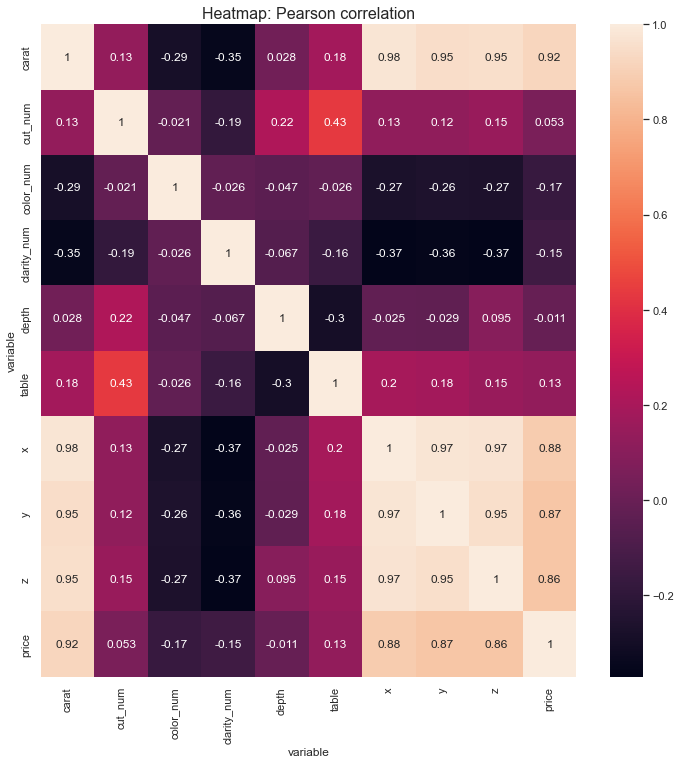

In [21]:
print("Plotting pearson correlation heatmap for diamonds dataset..")
cols = ['carat', 'cut_num', 'color_num', 'clarity_num', 'depth', 'table',\
        'x', 'y', 'z', 'price']
pearson_plot(diamonds_df_scaled, cols)

The variables - `carat`, `x`, `y`, `z` have high correlation with the target variable `price`. It suggests that the `price` of a diamond is highly correlated to the size of the diamond (determined by `x`, `y`, and `z`) and weight of the diamond (determined by `carat`). The bigger the diamond, costlier it is. Also, the heavier the diamond, costlier it is. Low correlation with `depth`, `table`, `color`, `clarity` and `cut` suggests that the prices are not heavily dependent on these features for a diamond.

##### For pollution dataset

Plotting pearson correlation heatmap for pollution dataset..


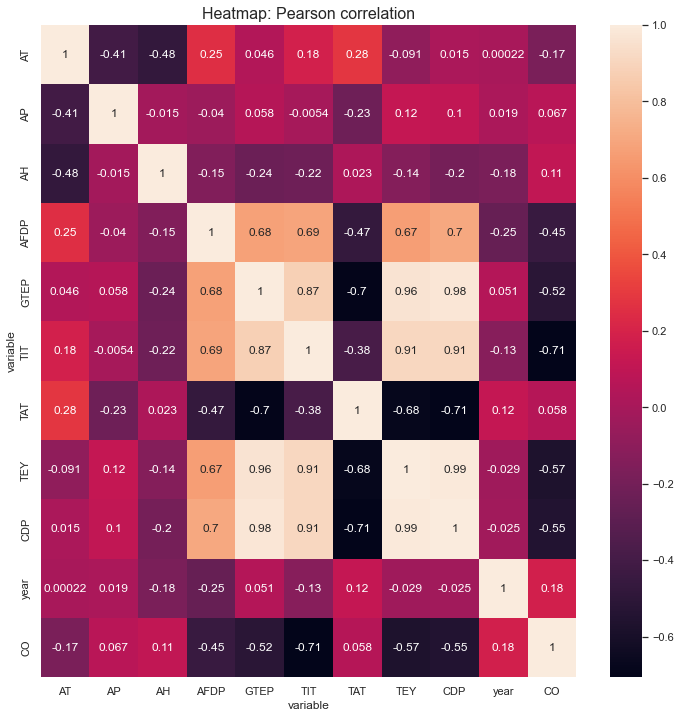

In [22]:
print("Plotting pearson correlation heatmap for pollution dataset..")
cols = ['AT', 'AP', 'AH', 'AFDP', 'GTEP', 'TIT', 'TAT', 'TEY', 'CDP', 'year', 'CO']
pearson_plot(pollution_df_scaled, cols)

The variables - `AFDP`, `GTEP`, `TIT`, `TEY` and `CDP` have high negative correlation with the target variable `CO`. It suggests that as the values for these variables increase, the value for `CO` decreases. 

### QUESTION 3

In [23]:
def plot_histogram(data: pd.DataFrame(), feature: str, range_val = None, bins = 50):
    '''
    For a given feature in the dataset, plot histogram
    '''
    plt.figure(figsize=(12,4))
    plt.hist(data[feature], bins = bins, range= range_val)
    plt.title('Frequency plot: '+ feature, fontsize = 16)
    plt.xlabel(feature)
    plt.ylabel('frequency')
    plt.show()

##### For diamonds dataset

Plotting histograms for continuous variables in diamonds dataset..


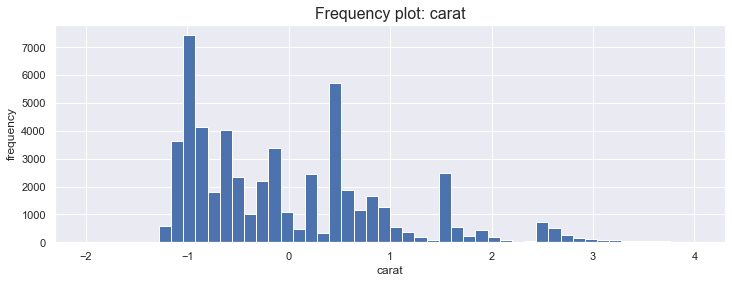

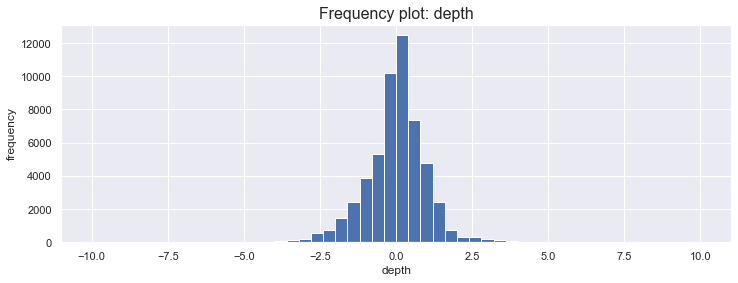

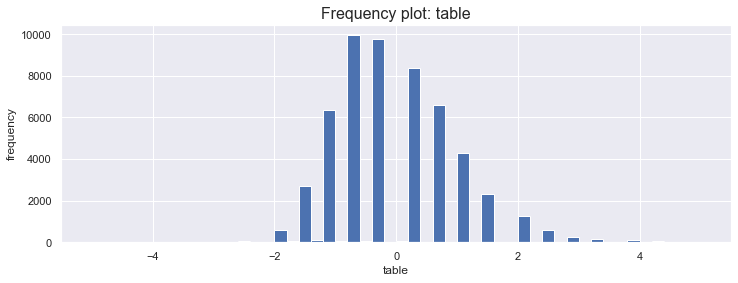

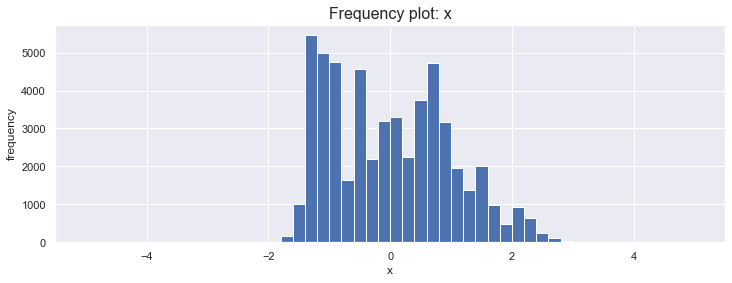

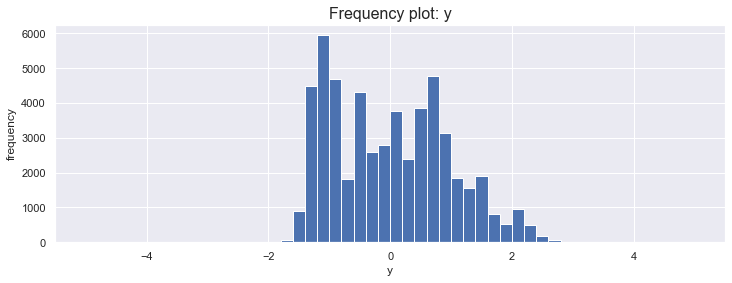

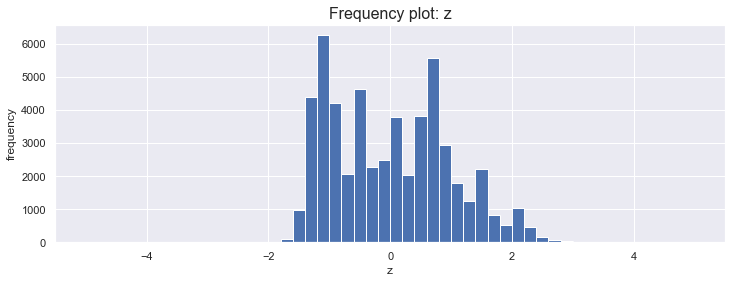

In [24]:
print("Plotting histograms for continuous variables in diamonds dataset..")
numeric_features = ['carat', 'depth', 'table', 'x', 'y', 'z']
range_map = {'carat' : [-2, 4], 'depth' : [-10, 10], 'table' : [-5,5], \
             'x' : [-5,5], 'y': [-5,5], 'z': [-5,5]}

for feature in numeric_features:
    plot_histogram(diamonds_df_scaled, feature, range_map[feature])

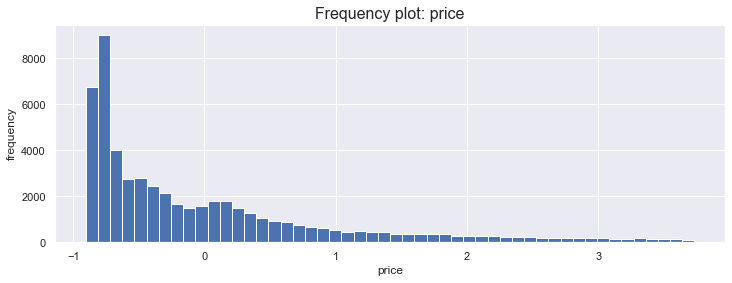

In [25]:
plt.figure(figsize=(12,4))
plt.hist(diamonds_df_scaled['price'], bins = 50)
plt.title('Frequency plot: price', fontsize = 16)
plt.xlabel('price')
plt.ylabel('frequency')
plt.show()

Target variable `price` has a long right tail.

##### For pollution dataset

Plotting histograms for continuous variables in pollution dataset..


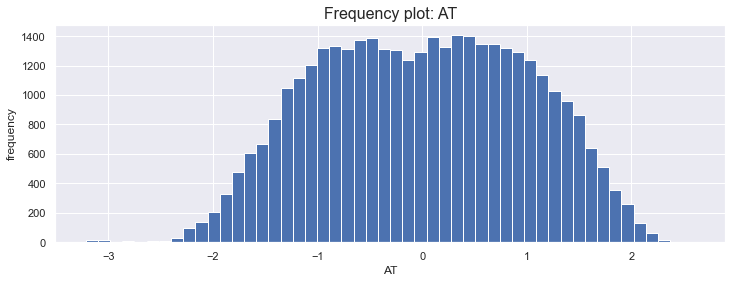

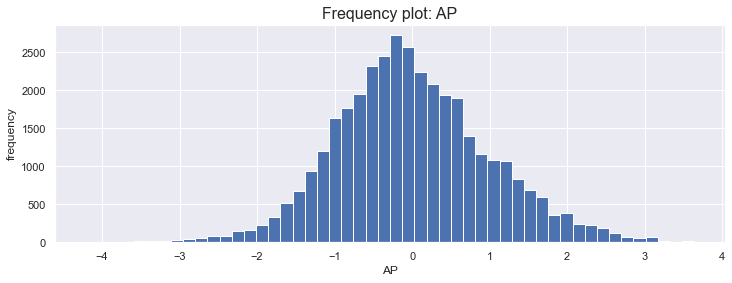

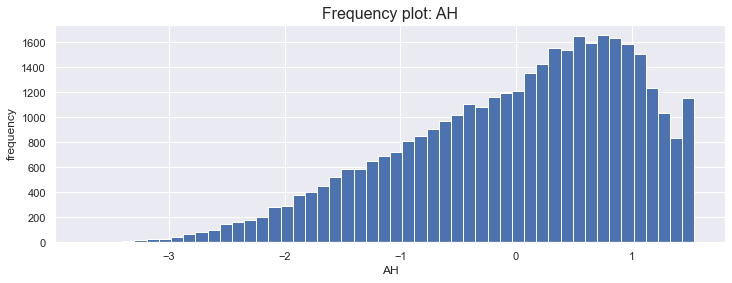

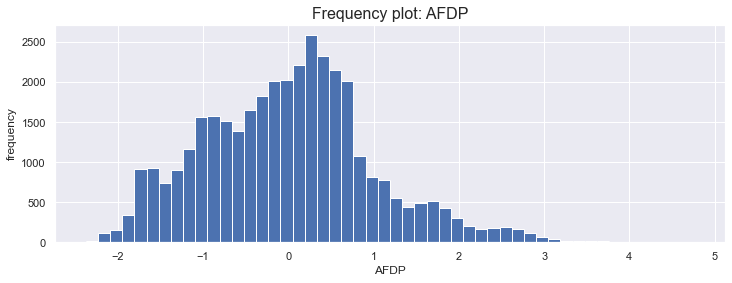

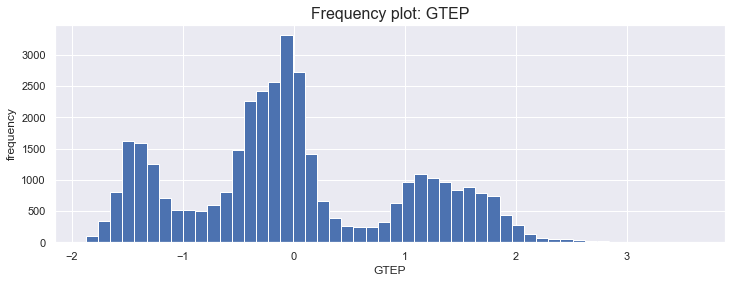

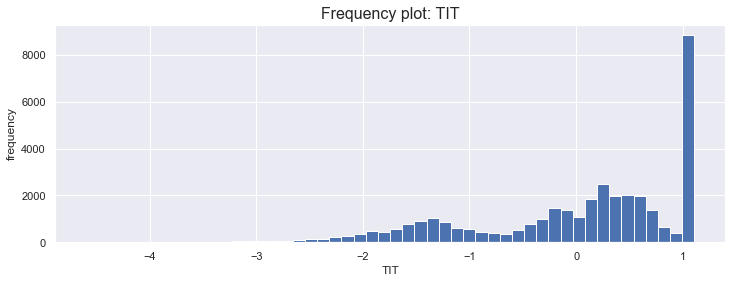

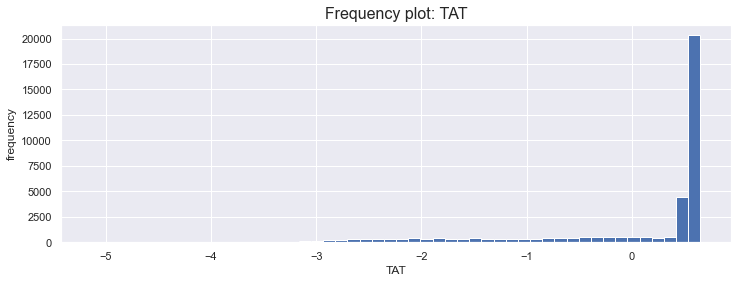

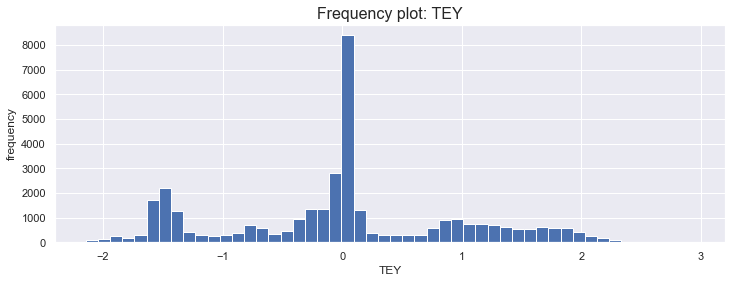

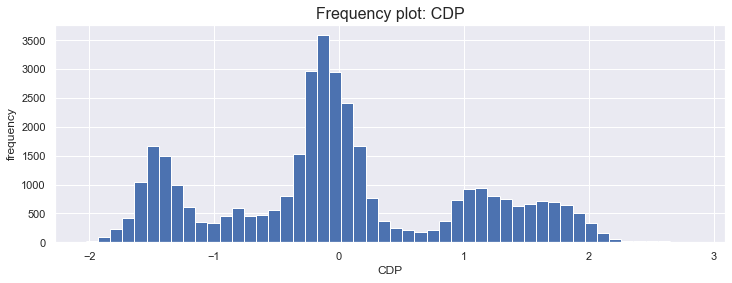

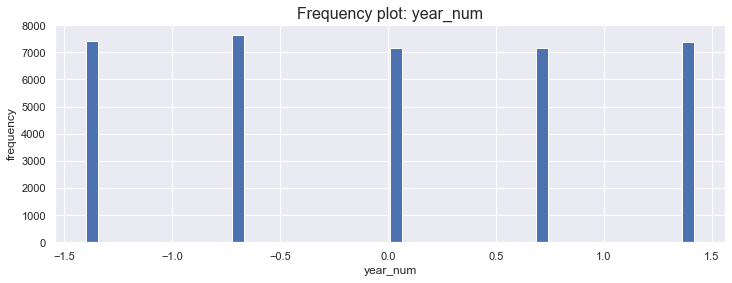

In [26]:
print("Plotting histograms for continuous variables in pollution dataset..")
numeric_features = ['AT', 'AP', 'AH', 'AFDP', 'GTEP', 'TIT', 'TAT', 'TEY', 'CDP', \
       'year_num']

for feature in numeric_features:
    plot_histogram(pollution_df_scaled, feature)

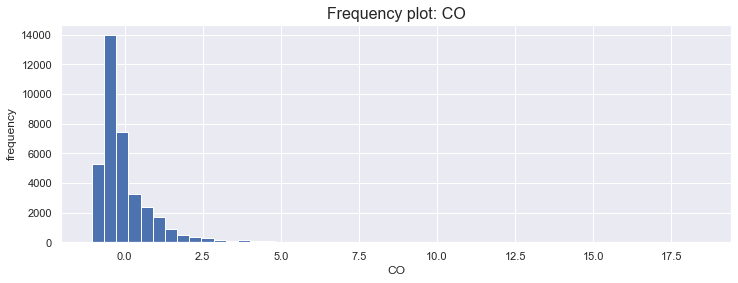

In [27]:
plt.figure(figsize=(12,4))
plt.hist(pollution_df_scaled['CO'], bins = 50)
plt.title('Frequency plot: CO', fontsize = 16)
plt.xlabel('CO')
plt.ylabel('frequency')
plt.show()

In order to handle skewness of a feature, we can apply a transformation on the feature which leads to the transformed feature being closer to normal distribution. Most popular transformations to handle skewness are - log transform, square root transform and box cox transform.

### QUESTION 4

In [28]:
def plot_boxplot(data: pd.DataFrame(), feature: str, target: str, sort_val : str):
    '''
    For a given categorical feature in the dataset, plot box plot
    '''
    plt.figure(figsize=(12,4))
    data = data.sort_values(sort_val)
    sns.boxplot(y = data[target], x = data[feature])
    
    plt.title('Box plot: '+ feature, fontsize = 16)
    plt.xlabel(feature)
    plt.ylabel(target)
    plt.show()
   

##### For diamonds dataset

Plotting box plots for categorical features in diamonds dataset..


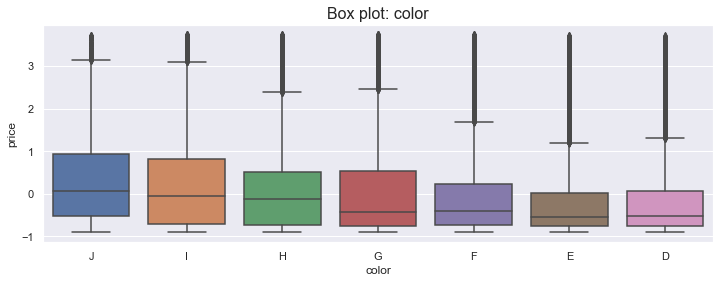

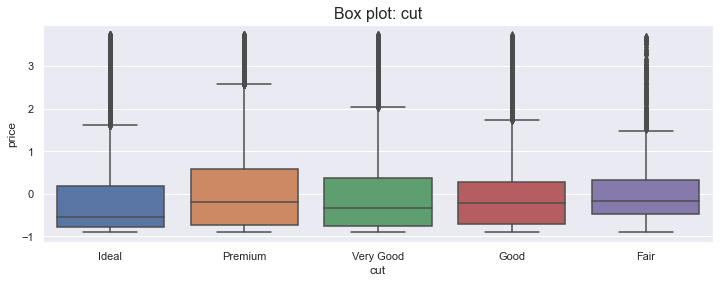

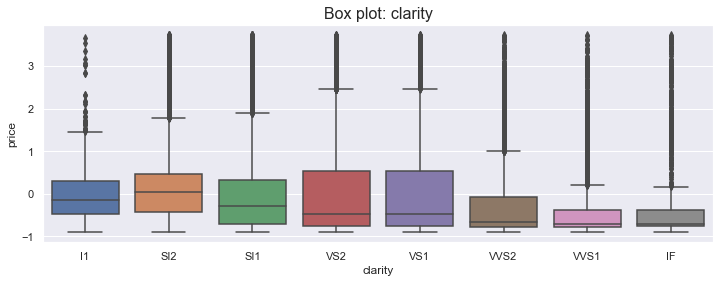

In [29]:
print("Plotting box plots for categorical features in diamonds dataset..")
cat_features = ['color', 'cut', 'clarity']
features_num = ['color_num', 'cut_num', 'clarity_num']
target = 'price'

for i in range(len(cat_features)):
    plot_boxplot(diamonds_df_scaled, cat_features[i], target, features_num[i])

From the above box plots we observe that prices within each category in `color`, `cut`, `clarity` have high `price` outlier diamonds. Within each category, most of the diamonds have low prices given by lower median bars. The large top bar suggests that there are some stones with high prices and there is more variation in price for some high priced stones. There are diamonds with outlier(exceptionally high) prices as well (values beyond Q3+1.5* IQR). Q3 is the 75th percentile and IQR is the difference between Q3 and Q2. Q2 is the 25th percentile. <br>

The color box plot suggests that the median price is lower for better colored diamonds. But there are many high priced outliers. For worse color diamonds, the median price is higher but there are few outliers. <br>

For cut, we see the premium quality has relatively higher median price. For clarity as well we see higher median price for I1 compared to IF which is counter-intuitive. We have larger spread for VS2 and VS1 diamonds. We might be observing these trends because of data frequency and confounding effects with other variables such as carat. <br>

##### For pollution dataset

Plotting box plots for categorical features in pollution dataset..
Plotting box plots..


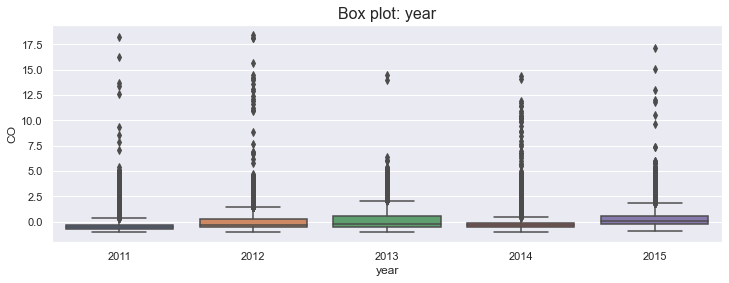

In [30]:
print("Plotting box plots for categorical features in pollution dataset..")
cat_features = ['year']
target = 'CO'

print("Plotting box plots..")
for i in range(len(cat_features)):
    plot_boxplot(pollution_df_scaled, cat_features[i], target, cat_features[i])

From the above box plots we observe that for each year we have very less variation in the CO emission measurements. However, some sensor aggregations indicate high CO emissions evident from the outlier values. The outliers deviate in large magnitude from the general distribution across years.

### QUESTION 5

In [31]:
def plot_freq(data: pd.DataFrame(), feature: str, feature_order: dict):
    '''
    For a given feature in the dataset, plot histogram
    '''
    tmp = data[feature].value_counts().reset_index()
    tmp['order']= tmp['index'].map(feature_order)
    tmp = tmp.sort_values(by=['order'])
    a = tmp['index']
    b = tmp[feature]
    plt.figure(figsize=(12,4))
    plt.bar(a, b)
    plt.title('Frequency plot: '+ feature, fontsize = 16)
    plt.xlabel(feature)
    plt.ylabel('count')
    plt.show()
   

##### For diamonds dataset

Plotting frequency for categorical features in diamonds dataset..


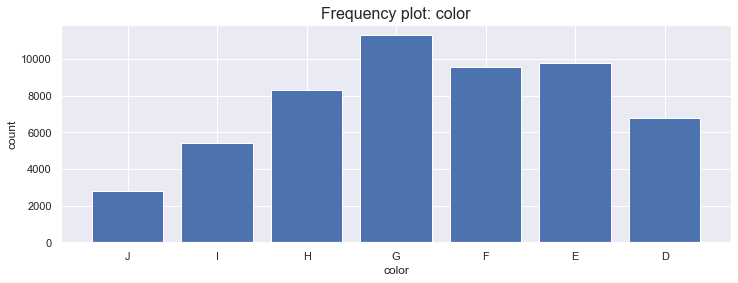

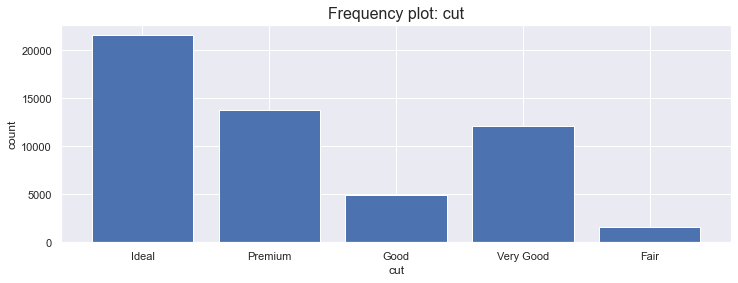

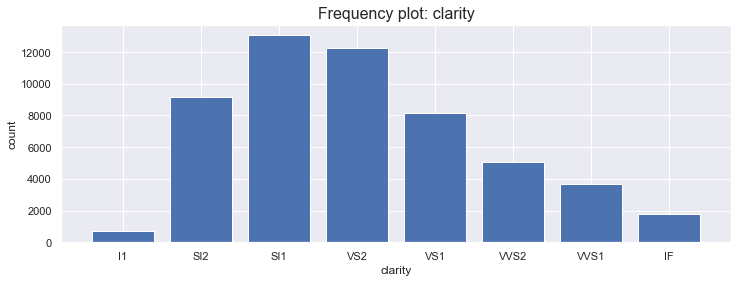

In [32]:
print("Plotting frequency for categorical features in diamonds dataset..")
cat_features = ['color', 'cut', 'clarity']

feature_order_map = {'cut': {'Ideal' : 1, 'Premium' : 2, 'Good' : 3, 'Very Good' : 4, 'Fair': 5}, \
                    'clarity' : {'I1' : 1, 'SI2' : 2, 'SI1' : 3, 'VS2' : 4, 'VS1': 5, 'VVS2':6, 'VVS1':7, 'IF':8}, \
                    'color' : {'J' : 1, 'I' : 2, 'H' : 3, 'G' : 4, 'F': 5, 'E': 6, 'D': 7}}

for feature in cat_features:
    plot_freq(diamonds_df_scaled, feature, feature_order_map[feature])

### QUESTION 6

In [33]:
def plot_yearly_trend(data, feature, years):
    plt.figure(figsize=(12,4))
    for year in years:
        plt.plot(data[data['year'] == year]['hour_index'], data[data['year'] == year][feature], label = year)
    plt.title('Yearly trend plot: '+ feature, fontsize = 16)
    plt.xlabel('time')
    plt.ylabel(feature)
    plt.legend()
    plt.show()

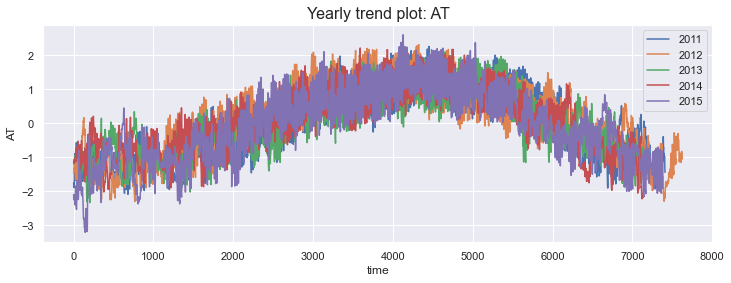

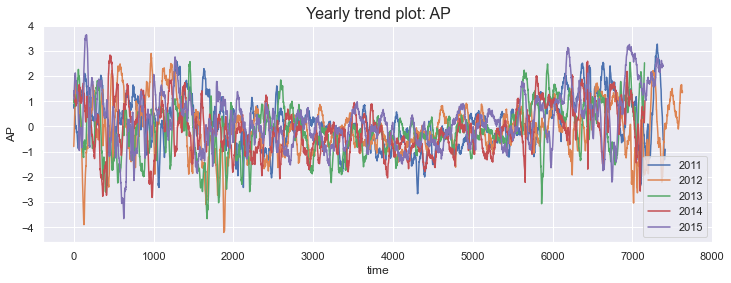

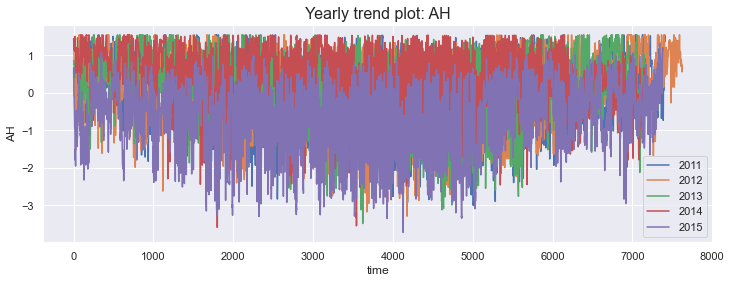

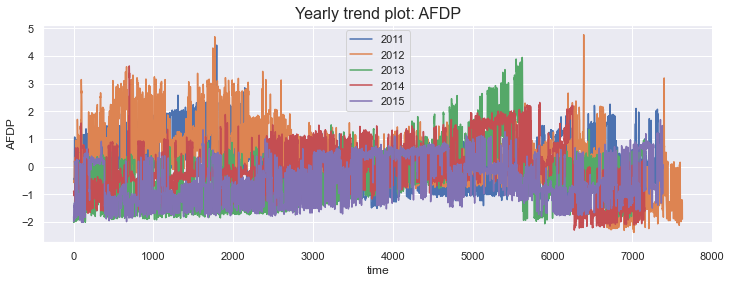

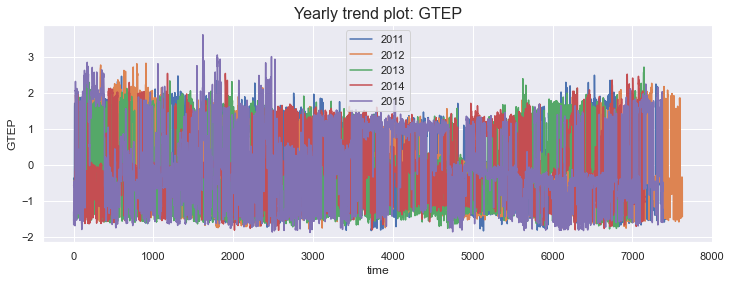

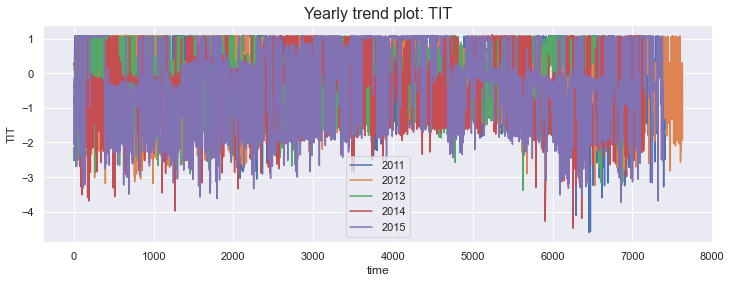

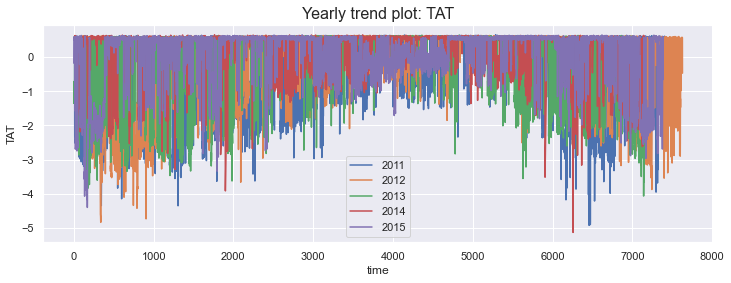

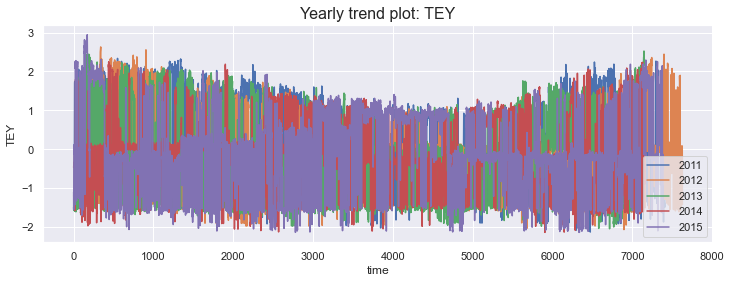

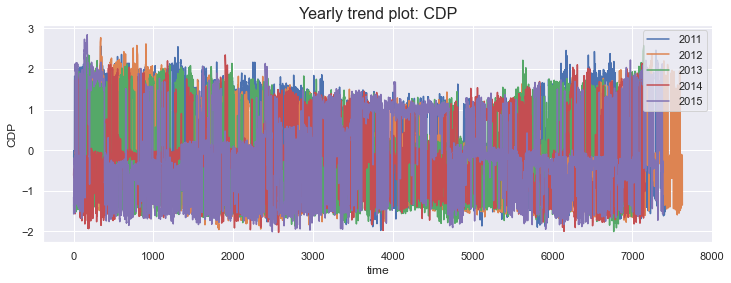

In [34]:
years = list(set(pollution_df_scaled['year']))
features = ['AT', 'AP', 'AH', 'AFDP', 'GTEP', 'TIT', 'TAT', 'TEY', 'CDP']

for feature in features:
    plot_yearly_trend(pollution_df_scaled, feature, years)

For `AT` across the years, the value peaks at around middle of the year and has an inverted U curve with a lot of variance in daily values. We see slightly distinct peaks for `AFDP` across the years. For other variables, the pattern seem quite noisy. For `TAT`, there are some extreme low values in year 2011 compared to the rest.

### QUESTION 7

The methods based on F-test estimates the degree of linear dependency between two random variables. On the other hand, mutual information methods can capture any kind of statistical dependency, but being nonparametric, they require more samples for accurate estimation. 

In [35]:
def get_mutual_info_df (data: pd.DataFrame(), target: str, features: list):
    '''
    returns a dataframe with feature name and mutual information
    '''
    y = np.array(data[target])
    mi = mutual_info_regression(data[features], y.ravel(),\
                                random_state=42, n_neighbors = 5)
    tmp = pd.DataFrame({'feature': features, 'mutual_info': mi})
    return tmp


In [36]:
def get_f_statistic_df (data: pd.DataFrame(), target: str, features: list):
    '''
    returns a dataframe with feature name and f statistic along with p value
    '''
    y = np.array(data[target])
    f_stat, p_val = f_regression(data[features], y.ravel())
    tmp = pd.DataFrame({'feature': features, 'f_stat': f_stat, 'p_val': p_val})
    return tmp


##### For diamonds dataset

In [37]:
print("Feature selection for diamonds dataset..")
all_features_diamond = ['carat', 'cut_num', 'color_num', 'clarity_num', 'depth', 'table',\
        'x', 'y', 'z']
target_diamond = 'price'
mi = get_mutual_info_df(diamonds_df_scaled, target_diamond, all_features_diamond)
f_stat = get_f_statistic_df(diamonds_df_scaled, target_diamond, all_features_diamond)

feat_sel = pd.merge(mi, f_stat, how = 'left', on = 'feature')
feat_sel

Feature selection for diamonds dataset..


,feature,mutual_info,f_stat,p_val
0,carat,1.621646,304051.486619,0.000000e+00
1,cut_num,0.054738,154.784468,1.746019e-35
2,color_num,0.133398,1654.401244,0.000000e+00
3,clarity_num,0.212236,1188.007065,1.571721e-257
4,depth,0.027190,6.115863,1.340045e-02
5,table,0.033055,886.119363,3.769963e-193
6,x,1.393433,193741.523066,0.000000e+00
7,y,1.395241,160915.662263,0.000000e+00
8,z,1.346187,154923.266553,0.000000e+00


Low mutual information score and F-statistic suggest weaker relationship or random relationship between the variable and the target variable. Variables with weaker relationship with the target variable are: `cut_num`, `depth` and `table`. Removing these variables should reduce the noise in the predictions and lead to better generalization. Hence, the RMSE on the test set should reduce if we perform feature selection and keep only appropriate features which have strong relationship with the target variable. <br> 

`carat`, `x`, `y` , `z` have strong relationship with the target variable where as `color` and `clarity` have moderate relationship. <br>

In [38]:
selected_features_diamond = ['carat', 'x', 'y', 'z', 'color_num', 'clarity_num']

##### For pollution dataset

In [39]:
print("Feature selection for pollution dataset..")
all_features_pollution = ['AT', 'AP', 'AH', 'AFDP', 'GTEP', 'TIT', 'TAT', 'TEY', 'CDP', 'year_num']
target_pollution = 'CO'
mi = get_mutual_info_df(pollution_df_scaled, target_pollution, all_features_pollution)
f_stat = get_f_statistic_df(pollution_df_scaled, target_pollution, all_features_pollution)

feat_sel = pd.merge(mi, f_stat, how = 'left', on = 'feature')
feat_sel

Feature selection for pollution dataset..


,feature,mutual_info,f_stat,p_val
0,AT,0.100237,1151.220905,1.701222e-248
1,AP,0.044572,165.877529,7.106951e-38
2,AH,0.022060,422.080131,2.882457e-93
3,AFDP,0.275695,9245.083774,0.000000e+00
4,GTEP,0.444751,13534.970544,0.000000e+00
5,TIT,0.540375,36558.688346,0.000000e+00
6,TAT,0.161008,125.500842,4.408086e-29
7,TEY,0.497194,17660.022764,0.000000e+00
8,CDP,0.471864,16015.416774,0.000000e+00
9,year_num,0.126037,1208.144337,1.755865e-260


`AP` and `AH` have very low mutual information score and `TAT` has a low F statistic. We will exclude these features from model training.

In [40]:
selected_features_pollution = ['AT', 'AFDP', 'GTEP', 'TIT', 'TEY', 'CDP', 'year_num']

### QUESTION 8

Linear regression tries to minimize the residual sum of squares between the observed targets in the dataset and the targets predicted by the linear regression model. The objective function is given by: <br>
$\sum_{i=1}^{n}(Y_i - (WX_i + b))^2$ <br>
where, $n$ is the total number of records, $Y_i$ is the target value for record $i$, $W$ are the set of weights assigned to each independent variable from the model, $X_i$ are the set of independent variable values for the $i^th$ record and $b$ is the intercept term. Together, $WX_i + b$ is the prediction for the target from the linear regression model. <br>

For lasso regression, we add an L1 penalty to the above objective function and for ridge regression, we add an L2 penalty to the weights.

In [41]:
def rmse(y_true, y_pred):
    '''
    rmse scorer for cross validation
    '''
    error = np.linalg.norm(y_pred - y_true) / np.sqrt(len(y_true))
    return error

rmse_scorer = make_scorer(rmse)

In [42]:
def train_model(model, data: pd.DataFrame(), features: list, target: str,\
                        model_name: str, params = 'NA', cv = 10):
    '''
    Given a model and dataset, train the model on 10 fold cross validation with rmse score
    '''
    results = {}
    X = data[features]
    y = data[target]
    cv_results = cross_validate(model, X, y, cv=cv, scoring=rmse_scorer,\
                                return_train_score=True, n_jobs = -1)
    rmse_test = np.sum(cv_results['test_score'])/cv
    rmse_train = np.sum(cv_results['train_score'])/cv
    results['model'] = model_name
    results['params'] = params
    results['avg_train_rmse'] = rmse_train
    results['avg_test_rmse'] = rmse_test
    return results

In [43]:
def compare_train_test(train_error: dict, test_error : dict, title : str):
    '''
    visualize train and test error for various regularisation parameters for L1 and L2 reg models
    '''
    plt.figure(figsize=(12,4))
    plt.plot( [ log10(i) for i in list(train_error.keys())], list(train_error.values()), label = 'train')
    plt.plot( [ log10(i) for i in list(test_error.keys())], list(test_error.values()), label = 'test')
    plt.xlabel('log10(reg_parameter)')
    plt.ylabel('rmse')
    plt.title(title, fontsize = 14)
    plt.grid('True')
    plt.legend()
    plt.show()

In [44]:
def get_results(model, X, y, cv):
    cv_results = cross_validate(model, X, y, cv=cv, scoring=rmse_scorer,\
                                    return_train_score=True, n_jobs = -1)
    rmse_test = np.sum(cv_results['test_score'])/cv
    rmse_train = np.sum(cv_results['train_score'])/cv
    model.fit(X, y)
    return rmse_test, rmse_train, model.coef_
    

def train_regModel_wCoef(model_name, data: pd.DataFrame(), features: list, target: str, grid_params : dict, cv = 10):
    
    results_test = {}
    results_train = {}
    results_coef = {}
    
    X = data[features]
    y = data[target]

    for alpha in grid_params['alpha']:
        if(model_name == 'Lasso'):
            model = Lasso(alpha = alpha, random_state = 42)
        elif(model_name == 'Ridge'):
            model = Ridge(alpha = alpha, random_state = 42)
        rmse_test, rmse_train, coef = get_results(model, X, y, cv)
        results_test[alpha] = rmse_test
        results_train[alpha] = rmse_train
        results_coef[alpha] = coef
        
    return results_test, results_train, results_coef

def generate_reg_report (model_name, data, features, target, grid_params, cv):
    reg = 'L1' if model_name == 'Lasso' else 'L2'
    results_test, results_train, results_coeff = train_regModel_wCoef(model_name,\
                                                                  data, \
                                                                  features, target, \
                                                                  grid_params, 10)
    print("Plotting train and test rmse across regularisation parameters for "+reg+" regularisation..")
    compare_train_test(results_train,results_test, "Compare train and test rmse for "+reg+" regularisation")
    
    print("Table showing various coefficients(in columns) for different alpha values(in rows) for "+reg+" regularisation..")
    print(pd.DataFrame.from_dict(results_coeff, orient = 'index'))
    
    best_alpha = min(results_test, key=results_test.get)
    best_params = {'alpha': best_alpha}
    if(model_name == 'Lasso'):
        model = Lasso(**best_params, random_state = 42)
    else:
        model = Ridge(**best_params, random_state = 42)
    result = train_model(model, data, features,\
                         target, str(model_name)+' Regression', best_params)
    return result



In [45]:
all_model_results_diamond = []
all_model_results_pollution = []

##### For diamonds dataset

Training baseline regression model for diamonds dataset with selected features..
Creating results to analyze the effect of regularisation parameter for L1 regularisation..
Plotting train and test rmse across regularisation parameters for L1 regularisation..


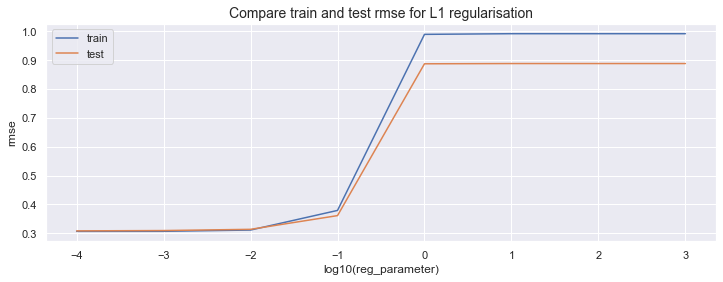

Table showing various coefficients(in columns) for different alpha values(in rows) for L1 regularisation..
                  0         1         2         3         4         5
0.0001     1.242308 -0.164872  0.021041 -0.066405  0.138174  0.216819
0.0010     1.205831 -0.116586  0.000000 -0.058208  0.136337  0.216429
0.0100     1.019122 -0.000000  0.000000 -0.000000  0.119776  0.205856
0.1000     0.838953  0.000000  0.000000  0.000000  0.000000  0.049215
1.0000     0.000000  0.000000  0.000000  0.000000 -0.000000 -0.000000
10.0000    0.000000  0.000000  0.000000  0.000000 -0.000000 -0.000000
100.0000   0.000000  0.000000  0.000000  0.000000 -0.000000 -0.000000
1000.0000  0.000000  0.000000  0.000000  0.000000 -0.000000 -0.000000
Creating results to analyze the effect of regularisation parameter for L2 regularisation..
Plotting train and test rmse across regularisation parameters for L2 regularisation..


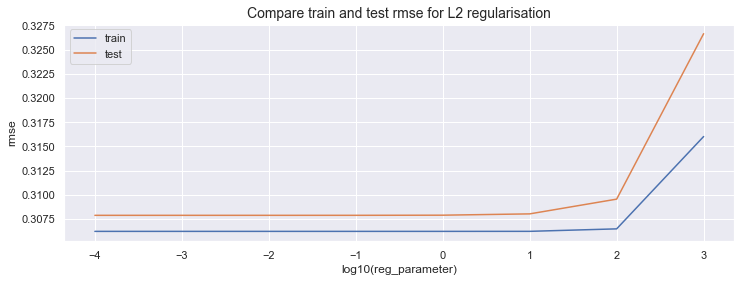

Table showing various coefficients(in columns) for different alpha values(in rows) for L2 regularisation..
                  0         1         2         3         4         5
0.0001     1.246584 -0.172075  0.025014 -0.067305  0.138380  0.216846
0.0010     1.246583 -0.172074  0.025014 -0.067305  0.138380  0.216846
0.0100     1.246578 -0.172069  0.025013 -0.067305  0.138379  0.216846
0.1000     1.246529 -0.172019  0.025008 -0.067301  0.138378  0.216846
1.0000     1.246037 -0.171519  0.024952 -0.067268  0.138362  0.216847
10.0000    1.241155 -0.166580  0.024416 -0.066927  0.138201  0.216855
100.0000   1.195544 -0.122596  0.020613 -0.062823  0.136667  0.216865
1000.0000  0.913708  0.073584  0.038931 -0.006099  0.125451  0.213930


In [46]:
print("Training baseline regression model for diamonds dataset with selected features..")
model = LinearRegression(n_jobs = -1)
result = train_model(model, diamonds_df_scaled, selected_features_diamond, target_diamond, 'Linear Regression')
all_model_results_diamond.append(result)

print("Creating results to analyze the effect of regularisation parameter for L1 regularisation..")
grid_params = {
        'alpha': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000]}
result = generate_reg_report('Lasso',\
                                                                  diamonds_df_scaled, \
                                                                  selected_features_diamond, target_diamond, \
                                                                  grid_params, 10)
all_model_results_diamond.append(result)

print("Creating results to analyze the effect of regularisation parameter for L2 regularisation..")
grid_params = {
        'alpha': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000]}
result = generate_reg_report('Ridge',\
                                                                  diamonds_df_scaled, \
                                                                  selected_features_diamond, target_diamond, \
                                                                  grid_params, 10)
all_model_results_diamond.append(result)

In [47]:
pd.DataFrame.from_dict(all_model_results_diamond)

,model,params,avg_train_rmse,avg_test_rmse
0,Linear Regression,NA,0.306212,0.307871
1,Lasso Regression,{'alpha': 0.0001},0.306215,0.307962
2,Ridge Regression,{'alpha': 0.0001},0.306212,0.307871


##### For pollution dataset

Training baseline regression model for pollution dataset with selected features..
Creating results to analyze the effect of regularisation parameter for L1 regularisation..
Plotting train and test rmse across regularisation parameters for L1 regularisation..


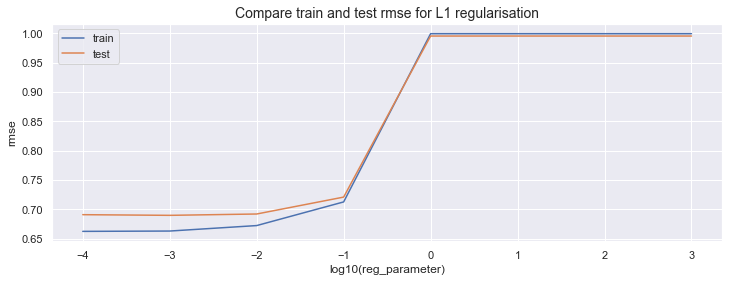

Table showing various coefficients(in columns) for different alpha values(in rows) for L1 regularisation..
                  0         1         2         3         4         5  \
0.0001    -0.183258  0.000597  0.082464 -0.850480 -1.497331  1.625373   
0.0010    -0.131312  0.000879  0.056860 -0.920918 -1.136598  1.355722   
0.0100     0.000000  0.004088  0.030332 -1.040039 -0.000000  0.352438   
0.1000    -0.000000 -0.000000  0.000000 -0.605992 -0.000000 -0.000000   
1.0000    -0.000000 -0.000000 -0.000000 -0.000000 -0.000000 -0.000000   
10.0000   -0.000000 -0.000000 -0.000000 -0.000000 -0.000000 -0.000000   
100.0000  -0.000000 -0.000000 -0.000000 -0.000000 -0.000000 -0.000000   
1000.0000 -0.000000 -0.000000 -0.000000 -0.000000 -0.000000 -0.000000   

                  6  
0.0001     0.064690  
0.0010     0.060047  
0.0100     0.046133  
0.1000     0.002250  
1.0000     0.000000  
10.0000    0.000000  
100.0000   0.000000  
1000.0000  0.000000  
Creating results to analyze the effec

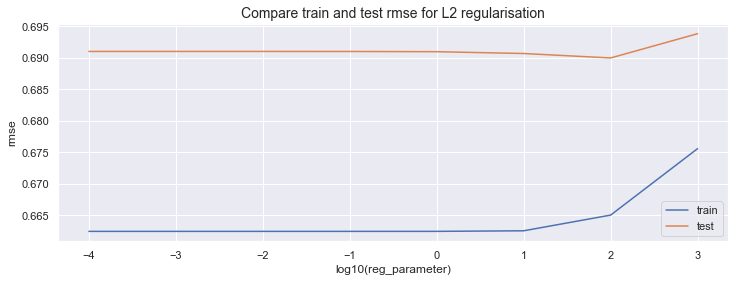

Table showing various coefficients(in columns) for different alpha values(in rows) for L2 regularisation..
                  0         1         2         3         4         5  \
0.0001    -0.190271  0.000529  0.086165 -0.840659 -1.545671  1.660898   
0.0010    -0.190269  0.000529  0.086165 -0.840662 -1.545656  1.660886   
0.0100    -0.190248  0.000530  0.086165 -0.840690 -1.545508  1.660764   
0.1000    -0.190047  0.000546  0.086165 -0.840970 -1.544034  1.659542   
1.0000    -0.188057  0.000696  0.086165 -0.843739 -1.529440  1.647447   
10.0000   -0.170094  0.002079  0.086434 -0.868532 -1.397303  1.537389   
100.0000  -0.085372  0.009865  0.099718 -0.975583 -0.751882  0.974273   
1000.0000 -0.043248  0.024379  0.153701 -0.898842 -0.193884  0.284272   

                  6  
0.0001     0.065303  
0.0010     0.065302  
0.0100     0.065301  
0.1000     0.065281  
1.0000     0.065091  
10.0000    0.063382  
100.0000   0.055748  
1000.0000  0.063641  


In [48]:
print("Training baseline regression model for pollution dataset with selected features..")
model = LinearRegression(n_jobs = -1)
result = train_model(model, pollution_df_scaled, selected_features_pollution, target_pollution, 'Linear Regression')
all_model_results_pollution.append(result)

print("Creating results to analyze the effect of regularisation parameter for L1 regularisation..")
grid_params = {
        'alpha': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000]}
result = generate_reg_report('Lasso',\
                                                                  pollution_df_scaled, \
                                                                  selected_features_pollution, target_pollution, \
                                                                  grid_params, 10)
all_model_results_pollution.append(result)

print("Creating results to analyze the effect of regularisation parameter for L2 regularisation..")
grid_params = {
        'alpha': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000]}
result = generate_reg_report('Ridge',\
                                                                  pollution_df_scaled, \
                                                                  selected_features_pollution, target_pollution, \
                                                                  grid_params, 10)
all_model_results_pollution.append(result)

In [49]:
pd.DataFrame.from_dict(all_model_results_pollution)

,model,params,avg_train_rmse,avg_test_rmse
0,Linear Regression,NA,0.662448,0.690991
1,Lasso Regression,{'alpha': 0.001},0.663014,0.689782
2,Ridge Regression,{'alpha': 100},0.665031,0.689959


Lasso and ridge regression are regularization methods, which are used to put constraints on the weights of the model. Regularisation is used to penalise complex models. <br>

Lasso regression applies an L1 penalisation on the weights, so that the loss function is : 
$\sum_{i=1}^{n}(Y_i - (WX_i + b))^2 + \alpha \sum_{j=1}^{k} |W_j|$ <br> We observe that, as the regularisation parameter is increased, some of the coefficients become 0 for the lasso regression. This implies that lasso regression can also be used for feature selection. We also, observe an increase in train and test rmse with increase in regularisation parameter, meaning that the less complex model is not predictive enough. <br>

Ridge regression applies an L2 penalisation on the weights, so that the loss function is : <br>
$\sum_{i=1}^{n}(Y_i - (WX_i + b))^2 + \alpha \sum_{j=1}^{k} ||W_j||$ <br> We observe that, as the regularisation parameter is increased, the coefficient values start to decrease and come closer to zero. We also, observe an increase in train and test rmse. However, the increase is less compared to the lasso regression. <br>

### QUESTION 9

##### For diamonds dataset

In [50]:
pd.DataFrame.from_dict(all_model_results_diamond)

,model,params,avg_train_rmse,avg_test_rmse
0,Linear Regression,NA,0.306212,0.307871
1,Lasso Regression,{'alpha': 0.0001},0.306215,0.307962
2,Ridge Regression,{'alpha': 0.0001},0.306212,0.307871


For the diamonds dataset, with pre-selected features, the linear regression model and ridge regression model with very low regularisation perform better comared to the Lasso regression. However, the difference in performance is very small. The best regularisation scheme can be determined by first performing cross validation on a grid of alpha values to select best regularisation value for each of the Lasso and ridge regression. The best value is determined by average performance on the cross validation set. Then we can compare which regression scheme works best by comparing the performance of the 3 models. We can also incorporate some measure of generalisation by looking at the gap between train and validation error to choose the best set of hyper parameter.

##### For pollution dataset

In [51]:
pd.DataFrame.from_dict(all_model_results_pollution)

,model,params,avg_train_rmse,avg_test_rmse
0,Linear Regression,NA,0.662448,0.690991
1,Lasso Regression,{'alpha': 0.001},0.663014,0.689782
2,Ridge Regression,{'alpha': 100},0.665031,0.689959


For the pollution dataset, lasso regression with penalty = 0.001 performs best in terms of validation error.

### QUESTION 10

In [52]:
def generate_feature_scaling_table (data_scaled, data_unscaled, features, target_scaled, target_unscaled,\
                                    alpha_ls, cv):
    all_results_scaled = []
    all_results_unscaled = []
    
    # Linear regression
    model = LinearRegression(n_jobs = -1)
    result = train_model(model, data_scaled, features, target_scaled, 'Linear Regression')
    all_results_scaled.append(result)
    
    result = train_model(model, data_unscaled, features, target_unscaled, 'Linear Regression')
    all_results_unscaled.append(result)
    
    # Lasso and ridge regularisation
    for alpha in alpha_ls:
        models =  [Lasso(alpha=alpha, random_state = 42), Ridge(alpha=alpha, random_state = 42)]
        model_names = ['Lasso', 'Ridge']
        for i in range(len(model_names)):
            params = {'alpha': alpha}
            result = train_model(models[i], data_scaled, features, target_scaled,\
                                 model_names[i]+' Regression', params)
            all_results_scaled.append(result)
            result = train_model(models[i], data_unscaled, features, target_unscaled,\
                                 model_names[i]+' Regression', params)
            all_results_unscaled.append(result)
    
    results_scaled = pd.DataFrame.from_dict(all_results_scaled)
    results_scaled['params'] = results_scaled['params'].astype(str)
    results_scaled.columns = ['model', 'params', 'avg_train_rmse_scaled', 'avg_test_rmse_scaled']
    results_unscaled = pd.DataFrame.from_dict(all_results_unscaled)
    results_unscaled.columns = ['model', 'params', 'avg_train_rmse_unscaled', 'avg_test_rmse_unscaled']
    results_unscaled['params'] = results_unscaled['params'].astype(str)

    all_results = pd.merge(results_scaled, results_unscaled, how = 'left', on = ['model', 'params'])
    return all_results
        

##### For diamonds dataset

In [53]:
print("Compare results for scaled vs unscaled features for diamonds dataset ..")
target_diamond_unscaled = 'price_scaled'
alpha_ls = [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000]
feat_scaling_results = generate_feature_scaling_table(diamonds_df_scaled, diamonds_df, \
                                                      selected_features_diamond, target_diamond, \
                                                      target_diamond_unscaled, alpha_ls, 10)
feat_scaling_results

Compare results for scaled vs unscaled features for diamonds dataset ..


,model,params,avg_train_rmse_scaled,avg_test_rmse_scaled,avg_train_rmse_unscaled,avg_test_rmse_unscaled
0,Linear Regression,NA,0.306212,0.307871,0.306212,0.307871
1,Lasso Regression,{'alpha': 0.0001},0.306215,0.307962,0.306217,0.308023
2,Ridge Regression,{'alpha': 0.0001},0.306212,0.307871,0.306212,0.307871
3,Lasso Regression,{'alpha': 0.001},0.306411,0.309042,0.306617,0.309886
4,Ridge Regression,{'alpha': 0.001},0.306212,0.307871,0.306212,0.307871
5,Lasso Regression,{'alpha': 0.01},0.310805,0.313313,0.313118,0.321569
6,Ridge Regression,{'alpha': 0.01},0.306212,0.307871,0.306212,0.307871
7,Lasso Regression,{'alpha': 0.1},0.378893,0.360896,0.439756,0.444732
8,Ridge Regression,{'alpha': 0.1},0.306212,0.307872,0.306212,0.307878
9,Lasso Regression,{'alpha': 1},0.989606,0.887510,0.962337,0.872642


##### For pollution dataset

In [54]:
print("Compare results for scaled vs unscaled features for pollution dataset ..")
target_pollution_unscaled = 'CO_scaled'
alpha_ls = [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000]
feat_scaling_results = generate_feature_scaling_table(pollution_df_scaled, pollution_df, \
                                                      selected_features_pollution, target_pollution, \
                                                      target_pollution_unscaled, alpha_ls, 10)
feat_scaling_results

Compare results for scaled vs unscaled features for pollution dataset ..


,model,params,avg_train_rmse_scaled,avg_test_rmse_scaled,avg_train_rmse_unscaled,avg_test_rmse_unscaled
0,Linear Regression,NA,0.662448,0.690991,0.662448,0.690991
1,Lasso Regression,{'alpha': 0.0001},0.662456,0.690909,0.662450,0.690934
2,Ridge Regression,{'alpha': 0.0001},0.662448,0.690991,0.662448,0.690991
3,Lasso Regression,{'alpha': 0.001},0.663014,0.689782,0.662580,0.689483
4,Ridge Regression,{'alpha': 0.001},0.662448,0.690991,0.662448,0.690991
5,Lasso Regression,{'alpha': 0.01},0.672341,0.692061,0.672026,0.694967
6,Ridge Regression,{'alpha': 0.01},0.662448,0.690991,0.662448,0.690991
7,Lasso Regression,{'alpha': 0.1},0.712646,0.720887,0.680102,0.694806
8,Ridge Regression,{'alpha': 0.1},0.662448,0.690987,0.662448,0.690985
9,Lasso Regression,{'alpha': 1},0.999401,0.995404,0.709619,0.714026


Feature scaling changes the weights of the model. Feature scaling do not play any role in model performance for base linear regression without regularisation. This is because any scaling effect in the features should be captured by the change in weights and the intercept keeping the loss constant. However, if using gradient descent, the scaling would play a role as the gradients change. Since regularisation has a penalty on high weight values, we see that the regularised models perform worse without feature scaling. 

### QUESTION 11

p-value is a statistic which is used to infer whether a particular independent variable impacts the dependent variable statstically significantly. It describes how likely it is to observe the given set of data if the null hypothesis were true, where the null hypothesis is that the independent variable does not affect the dependent variable. If the value is small, then we reject the null hypothesis that the independent variable does not affect dependent variable. <br>

A p-value of 0.001 indicates that if the null hypothesis tested were indeed true, there would be a one in 1,000 chance of observing the data. <br>

### QUESTION 12

In [55]:
def get_data_columns_polynomial (data, features, target, degree):
    '''
    get dataset and feature list given a polynomial order on a dataset
    '''
    X = data[features]
    y = data[target]
    poly_reg=PolynomialFeatures(degree=degree)
    X_poly=poly_reg.fit_transform(X)
    columns = poly_reg.get_feature_names_out()

    poly_df = pd.DataFrame(data = X_poly, 
                      columns = columns)
    poly_df = poly_df.drop(['1'], axis = 1)
    columns = poly_df.columns
    poly_df[target] = y
    
    return poly_df, columns


##### For diamonds dataset

In [56]:
degree = 2
poly_df_2, columns_2 = get_data_columns_polynomial(diamonds_df_scaled, selected_features_diamond, \
                                                   target_diamond, degree)

mi = get_mutual_info_df(poly_df_2, target_diamond, columns_2)
f_stat = get_f_statistic_df(poly_df_2, target_diamond, columns_2)

feat_sel = pd.merge(mi, f_stat, how = 'left', on = 'feature')
feat_sel.sort_values(['mutual_info', 'f_stat'], ascending = [False,False]).head(25)

,feature,mutual_info,f_stat,p_val
11,carat clarity_num,1.707993,909.274840,4.217023e-198
0,carat,1.620390,304051.486619,0.000000e+00
6,carat^2,1.445774,30676.068058,0.000000e+00
2,y,1.394307,160915.662263,0.000000e+00
10,carat color_num,1.393466,4185.168229,0.000000e+00
1,x,1.392225,193741.523066,0.000000e+00
3,z,1.345392,154923.266553,0.000000e+00
8,carat y,1.050298,26021.887415,0.000000e+00
9,carat z,1.047803,28182.113655,0.000000e+00
7,carat x,1.046077,31023.831176,0.000000e+00


From the degree 2 polynomial features, the most salient features are [carat* clarity], suggesting that for different clarity categories, weight of the diamond has different effects on the price. We have [carat* carat], suggesting that as weight increases, prices increase in square root fashion. We have [carat* color] again suggesting weight having different effect on price for color categories. We also have features like [x* y] or, length * width suggesting that area across dimensions have an effect.

##### For pollution dataset

In [57]:
degree = 2
poly_df_2, columns_2 = get_data_columns_polynomial(pollution_df_scaled, selected_features_pollution, \
                                                   target_pollution, degree)

mi = get_mutual_info_df(poly_df_2, target_pollution, columns_2)
f_stat = get_f_statistic_df(poly_df_2, target_pollution, columns_2)

feat_sel = pd.merge(mi, f_stat, how = 'left', on = 'feature')
feat_sel.sort_values(['mutual_info', 'f_stat'], ascending = [False,False]).head(25)

,feature,mutual_info,f_stat,p_val
3,TIT,0.541354,36558.688346,0.000000e+00
28,TIT year_num,0.524304,99.966894,1.660770e-23
4,TEY,0.497038,17660.022764,0.000000e+00
5,CDP,0.472097,16015.416774,0.000000e+00
2,GTEP,0.444826,13534.970544,0.000000e+00
25,TIT^2,0.437256,35467.569005,0.000000e+00
33,CDP year_num,0.398241,9.744380,1.800113e-03
24,GTEP year_num,0.381877,4.362006,3.675587e-02
31,TEY year_num,0.377105,6.060219,1.383061e-02
26,TIT TEY,0.345556,17737.416514,0.000000e+00


Some of the salient features in the pollution dataset are - [TIT* TIT], interaction of features with the year, [TIT * TEY].

### QUESTION 13

##### For diamonds dataset

In [58]:
start_time = time.time()
degree_range = [2,3,4]
all_results_polynomial = []
alpha_ls = [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000]

for degree in degree_range:
    # generate polynomial feature data
    poly_df, columns = get_data_columns_polynomial(diamonds_df_scaled, selected_features_diamond,\
                                                   target_diamond, degree)
    
    # Linear regression
    model = LinearRegression(n_jobs = -1)
    result = train_model(model, poly_df, columns, target_diamond, 'Linear(poly degree='+str(degree)+')')
    all_results_polynomial.append(result)
    
    # Regularised regression
    for alpha in alpha_ls:
        models =  [Lasso(alpha=alpha, random_state = 42), Ridge(alpha=alpha, random_state = 42)]
        model_names = ['Lasso', 'Ridge']
        params = {'alpha': alpha}
        for i in range(len(model_names)):
            result = train_model(models[i], poly_df, columns, target_diamond,\
                                 model_names[i]+' (poly degree='+str(degree)+')', params)
            all_results_polynomial.append(result)
print("done in %0.3fs." % (time.time() - start_time))  

done in 412.480s.


In [59]:
print("Results for polynomial regression..")
result = pd.DataFrame.from_dict(all_results_polynomial)
result

Results for polynomial regression..


,model,params,avg_train_rmse,avg_test_rmse
0,Linear(poly degree=2),NA,0.195480,0.368182
1,Lasso (poly degree=2),{'alpha': 0.0001},0.196586,0.370314
2,Ridge (poly degree=2),{'alpha': 0.0001},0.195480,0.368181
3,Lasso (poly degree=2),{'alpha': 0.001},0.199914,0.308961
4,Ridge (poly degree=2),{'alpha': 0.001},0.195480,0.368172
5,Lasso (poly degree=2),{'alpha': 0.01},0.210834,0.209531
6,Ridge (poly degree=2),{'alpha': 0.01},0.195480,0.368077
7,Lasso (poly degree=2),{'alpha': 0.1},0.373516,0.354643
8,Ridge (poly degree=2),{'alpha': 0.1},0.195480,0.367159
9,Lasso (poly degree=2),{'alpha': 1},0.945338,0.879766


In [60]:
print("Best polynomial model with regularisation for diamonds dataset..")
print(result[result['avg_test_rmse'] == min(result['avg_test_rmse'])])

Best polynomial model with regularisation for diamonds dataset..
                   model           params  avg_train_rmse  avg_test_rmse
5  Lasso (poly degree=2)  {'alpha': 0.01}        0.210834       0.209531


In [61]:
model = list(result[(result['avg_test_rmse'] == min(result['avg_test_rmse']))]['model'])[0]
params = list(result[(result['avg_test_rmse'] == min(result['avg_test_rmse']))]['params'])[0]
best_result = [i for i in all_results_polynomial if (i['model'] == model and i['params'] == params)]
all_model_results_diamond.append(best_result[0])

Degree 2 polynomial features work best for the given dataset with L1 regularisation and alpha = 0.01. Introducing new features improved the validation rmse from ~0.3 to ~0.2. A high order polynomial would have more degree of freedom to fit (overfit) the training data and start learning noise from the data. The fit improves on the training dataset. However, it performs poorly on the validation set. The larger the degree more overfitting the model is. Degree of the polynomial is a hyper parameter and should be chosen using performance on a validation set. 

##### For pollution dataset

In [62]:
start_time = time.time()
degree_range = [2,3,4]
all_results_polynomial = []
alpha_ls = [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000]

for degree in degree_range:
    # generate polynomial feature data
    poly_df, columns = get_data_columns_polynomial(pollution_df_scaled, selected_features_pollution,\
                                                   target_pollution, degree)
    
    # Linear regression
    model = LinearRegression(n_jobs = -1)
    result = train_model(model, poly_df, columns, target_pollution, 'Linear(poly degree='+str(degree)+')')
    all_results_polynomial.append(result)
    
    # Regularised regression
    for alpha in alpha_ls:
        models =  [Lasso(alpha=alpha, random_state = 42), Ridge(alpha=alpha, random_state = 42)]
        model_names = ['Lasso', 'Ridge']
        params = {'alpha': alpha}
        for i in range(len(model_names)):
            result = train_model(models[i], poly_df, columns, target_pollution,\
                                 model_names[i]+' (poly degree='+str(degree)+')', params)
            all_results_polynomial.append(result)
print("done in %0.3fs." % (time.time() - start_time))  

done in 269.950s.


In [63]:
print("Results for polynomial regression..")
result = pd.DataFrame.from_dict(all_results_polynomial)
result

Results for polynomial regression..


,model,params,avg_train_rmse,avg_test_rmse
0,Linear(poly degree=2),NA,0.573496,0.682291
1,Lasso (poly degree=2),{'alpha': 0.0001},0.575407,0.694491
2,Ridge (poly degree=2),{'alpha': 0.0001},0.573496,0.682292
3,Lasso (poly degree=2),{'alpha': 0.001},0.577786,0.677124
4,Ridge (poly degree=2),{'alpha': 0.001},0.573496,0.682294
5,Lasso (poly degree=2),{'alpha': 0.01},0.597452,0.645245
6,Ridge (poly degree=2),{'alpha': 0.01},0.573496,0.682319
7,Lasso (poly degree=2),{'alpha': 0.1},0.633304,0.641899
8,Ridge (poly degree=2),{'alpha': 0.1},0.573510,0.682541
9,Lasso (poly degree=2),{'alpha': 1},0.993957,0.992652


In [64]:
print("Best polynomial model with regularisation for pollution dataset..")
print(result[result['avg_test_rmse'] == min(result['avg_test_rmse'])])

Best polynomial model with regularisation for pollution dataset..
                    model            params  avg_train_rmse  avg_test_rmse
37  Lasso (poly degree=4)  {'alpha': 0.001}        0.499656       0.602067


In [65]:
model = list(result[(result['avg_test_rmse'] == min(result['avg_test_rmse']))]['model'])[0]
params = list(result[(result['avg_test_rmse'] == min(result['avg_test_rmse']))]['params'])[0]
best_result = [i for i in all_results_polynomial if (i['model'] == model and i['params'] == params)]
all_model_results_pollution.append(best_result[0])

Degree 4 polynomial with Lasso regression (alpha = 0.001) gives the best validation rmse for the pollution dataset.

### QUESTION 14

For the diamonds dataset, it might make sense to include base area or volume of the diamond as a feature. We explore performance using these 2 new features.

In [66]:
df_tmp = diamonds_df.copy()

df_tmp['base_area_1'] = df_tmp.apply(lambda row: row['x']*row['y'], axis = 1)
df_tmp['base_area_2'] = df_tmp.apply(lambda row: row['y']*row['z'], axis = 1)
df_tmp['base_area_3'] = df_tmp.apply(lambda row: row['z']*row['x'], axis = 1)

df_tmp['vol'] = df_tmp.apply(lambda row: row['x']*row['y']*row['z'], axis = 1)

df_tmp['perimeter_1'] = df_tmp.apply(lambda row: 2 *(row['x'] + row['y']), axis = 1)
df_tmp['perimeter_2'] = df_tmp.apply(lambda row: 2 *(row['y'] + row['z']), axis = 1)
df_tmp['perimeter_3'] = df_tmp.apply(lambda row: 2 *(row['z'] + row['x']), axis = 1)


cols_to_scale = ['carat', 'cut_num', 'color_num', 'clarity_num', 'depth', 'table',\
        'x', 'y', 'z', 'base_area_1','base_area_2','base_area_3', \
                 'vol', 'price', 'perimeter_1', 'perimeter_2', 'perimeter_3']

standard_df2 = standardize(df_tmp,cols_to_scale)

features = ['carat', 'cut_num', 'color_num', 'clarity_num', 'depth', 'table',\
        'x', 'y', 'z', 'base_area_1','base_area_2','base_area_3', \
                 'vol',  'perimeter_1', 'perimeter_2', 'perimeter_3']

a = get_mutual_info_df(standard_df2, target_diamond, features)
b = get_f_statistic_df(standard_df2, target_diamond, features)
feat_selection = pd.merge(a,b, how = 'left', on = 'feature')
print(feat_selection)

        feature  mutual_info         f_stat          p_val
0         carat     1.621981  304051.486619   0.000000e+00
1       cut_num     0.055538     154.784468   1.746019e-35
2     color_num     0.134170    1654.401244   0.000000e+00
3   clarity_num     0.212332    1188.007065  1.571721e-257
4         depth     0.027534       6.115863   1.340045e-02
5         table     0.032167     886.119363  3.769963e-193
6             x     1.391760  193741.523066   0.000000e+00
7             y     1.395283  160915.662263   0.000000e+00
8             z     1.347702  154923.266553   0.000000e+00
9   base_area_1     1.378795  233082.111625   0.000000e+00
10  base_area_2     1.400420  184885.352841   0.000000e+00
11  base_area_3     1.391617  239704.780820   0.000000e+00
12          vol     1.418778  236517.164583   0.000000e+00
13  perimeter_1     1.377420  185951.626153   0.000000e+00
14  perimeter_2     1.424142  174129.251036   0.000000e+00
15  perimeter_3     1.417691  188196.234065   0.000000e+

In [67]:
print("Base linear regression results with new features..")
features = ['carat', 'cut_num', 'color_num', 'clarity_num', \
        'x', 'y', 'z', 'base_area_1','base_area_2','base_area_3', \
                 'vol',  'perimeter_1', 'perimeter_2', 'perimeter_3']

target = 'price'
model = LinearRegression(n_jobs = -1)
result = train_model(model, standard_df2, features, target, 'Linear Regression (feature engineering)')
print(result)

Base linear regression results with new features..
{'model': 'Linear Regression (feature engineering)', 'params': 'NA', 'avg_train_rmse': 0.29492529172667237, 'avg_test_rmse': 0.31767751896968294}


We tried to incorporate features related to the dimensions of the diamond. The perimeter or size of the diamond and area of the diamond might impact the price of the diamond. However, we observe that feature engineering although improving the performance on the train set, does not improve the performance on the test set suggesting overfitting. Running regularisation models might help improve the performance in test set. We observe in Q13 above, some interaction features were selected in the Lasso regression and it improved the performance on validation set.

### QUESTION 15

#### Neural Networks

Introduction of hidden layers and activation functions incorporates non-linearity in the feature relationships with the target. It allows for training more complex functions. Because of this increase in hypothesis space of functions that can be modeled, multi-layer perceptron or fully connected neural network performs better than the linear regression. 

### QUESTION 16

In [68]:
def perform_gridsearch(model, data: pd.DataFrame(), features: list, target: str, grid_params : dict, cv = 10):
    '''
    Given a model and a grid perform grid search on the given dataset.
    Returns best parameters and cross validation results 
    '''
    X = data[features]
    y = data[target]
    
    grid = GridSearchCV(model, grid_params, scoring='neg_root_mean_squared_error', cv = cv,\
                                   return_train_score=True, n_jobs = -1)
    grid.fit(X, y)
    tmp = pd.DataFrame.from_dict(grid.cv_results_)
    tmp = tmp[['params', 'mean_train_score', 'mean_test_score', 'rank_test_score']]
    tmp['mean_train_score'] = tmp['mean_train_score'].apply(lambda x: -x)
    tmp['mean_test_score'] = tmp['mean_test_score'].apply(lambda x: -x)
    return grid.best_params_ , tmp

##### For diamonds dataset

In [69]:
start_time = time.time()

model = MLPRegressor(random_state=42, max_iter=200, batch_size = 64, tol = 1e-4, early_stopping = True)
grid_params = {'hidden_layer_sizes': [(50), (100), (150), (250), (500), \
                                      (50, 20), (100, 30), (150, 40), (250, 50)],
        'activation': ['identity', 'relu'],
        'learning_rate_init' : [0.001, 0.1],
        'learning_rate' : ['constant', 'adaptive'],      
        'alpha': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000]}

best_params, cv_results = perform_gridsearch(model, diamonds_df_scaled, selected_features_diamond,\
                                                         target_diamond, grid_params, 5)
print("done in %0.3fs." % (time.time() - start_time)) 

done in 4822.923s.


In [70]:
cv_results.sort_values('rank_test_score').head(5)

,params,mean_train_score,mean_test_score,rank_test_score
336,"{'activation': 'relu', 'alpha': 0.001, 'hidden...",0.145987,0.243483,1
338,"{'activation': 'relu', 'alpha': 0.001, 'hidden...",0.145987,0.243483,1
306,"{'activation': 'relu', 'alpha': 0.0001, 'hidde...",0.143125,0.244036,3
304,"{'activation': 'relu', 'alpha': 0.0001, 'hidde...",0.143125,0.244036,3
400,"{'activation': 'relu', 'alpha': 0.1, 'hidden_l...",0.156420,0.244445,5


In [71]:
print("Best results for MLP regression for diamonds dataset is...")
print(cv_results[cv_results['params'] == best_params])

Best results for MLP regression for diamonds dataset is...
                                                params  mean_train_score  \
336  {'activation': 'relu', 'alpha': 0.001, 'hidden...          0.145987   

     mean_test_score  rank_test_score  
336         0.243483                1  


In [72]:
model = MLPRegressor(**best_params, random_state=42, max_iter=200, batch_size = 64, tol = 1e-4, early_stopping = True)
result = train_model(model, diamonds_df_scaled, selected_features_diamond, target_diamond, 'MLPRegressor', best_params, 10)
all_model_results_diamond.append(result)


##### For pollution dataset

In [73]:
start_time = time.time()

model = MLPRegressor(random_state=42, max_iter=200, batch_size = 64, tol = 1e-4, early_stopping = True)
grid_params = {'hidden_layer_sizes': [(50), (100), (150), (250), (500), \
                                      (50, 20), (100, 30), (150, 40), (250, 50), (500, 50)],
        'activation': ['identity', 'relu'],
        'learning_rate_init' : [0.001, 0.1],
        'learning_rate' : ['constant', 'adaptive'],      
        'alpha': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000]}

best_params, cv_results = perform_gridsearch(model, pollution_df_scaled, selected_features_pollution,\
                                                         target_pollution, grid_params, 5)
print("done in %0.3fs." % (time.time() - start_time)) 

done in 5349.791s.


In [74]:
cv_results.sort_values('rank_test_score').head(5)

,params,mean_train_score,mean_test_score,rank_test_score
489,"{'activation': 'relu', 'alpha': 1, 'hidden_lay...",0.625726,0.678532,1
491,"{'activation': 'relu', 'alpha': 1, 'hidden_lay...",0.625726,0.678532,1
507,"{'activation': 'relu', 'alpha': 1, 'hidden_lay...",0.621622,0.680333,3
505,"{'activation': 'relu', 'alpha': 1, 'hidden_lay...",0.621622,0.680333,3
485,"{'activation': 'relu', 'alpha': 1, 'hidden_lay...",0.623740,0.685200,5


In [75]:
print("Best results for MLP regression for diamonds dataset is...")
print(cv_results[cv_results['params'] == best_params])

Best results for MLP regression for diamonds dataset is...
                                                params  mean_train_score  \
489  {'activation': 'relu', 'alpha': 1, 'hidden_lay...          0.625726   

     mean_test_score  rank_test_score  
489         0.678532                1  


In [76]:
model = MLPRegressor(**best_params, random_state=42, max_iter=200, batch_size = 64, tol = 1e-4, early_stopping = True)
result = train_model(model, pollution_df_scaled, selected_features_pollution, target_pollution, 'MLPRegressor', best_params, 10)
all_model_results_pollution.append(result)


### QUESTION 17

**Diamonds dataset:** Since the price of the diamond is a positive real number, we can use `relu` as the activation function for which the range is the set of positive real numbers. Or we can use the identity, which keeps the output as it. We cannot use tanh or sigmoid(logistic) as the activation function as these functions restrict the output value to be between [0,1], in line with predicting probabilities. <br> 

Using relu allows for non-linearity and performs better as can be inferred from the grid results. <br>

Similarly, for CO emissions, relu activation function gives the best results.

### QUESTION 18

Increasing the depth of the network too far introduces too many parameters to be trained and increases the complexity of the functions leading to potential overfitting of the train data and poor generalization to validation set or test set. <br>

Moreover, there are many other technical complications with deeper neural networks, for example, problems such as the vanishing (and exploding) gradient problem which leads the gradients to be too small or too large leading to unstable results or no learning at all. <br>

### QUESTION 19

##### For diamonds dataset

In [77]:
start_time = time.time()

model = RandomForestRegressor(n_jobs = -1, random_state = 42)
grid_params = {'max_features': [1,2,3,4,5,6],
        'n_estimators': [20, 50, 100, 200],
        'max_depth': [2, 3, 4, 5, 6]}

best_params, cv_results = perform_gridsearch(model, diamonds_df_scaled, selected_features_diamond,\
                                                         target_diamond, grid_params, 10)
print("done in %0.3fs." % (time.time() - start_time))  # 403 sec

done in 410.252s.


In [78]:
cv_results['max_depth'] = cv_results['params'].apply(lambda x: x['max_depth'])
cv_results['max_features'] = cv_results['params'].apply(lambda x: x['max_features'])
cv_results['n_estimators'] = cv_results['params'].apply(lambda x: x['n_estimators'])

In [79]:
print("Understanding the effect of maximum number of features")
cv_results[(cv_results['max_depth'] == 6) & (cv_results['n_estimators'] == 100)]

Understanding the effect of maximum number of features


,params,mean_train_score,mean_test_score,rank_test_score,max_depth,max_features,n_estimators
98,"{'max_depth': 6, 'max_features': 1, 'n_estimat...",0.225418,0.263225,18,6,1,100
102,"{'max_depth': 6, 'max_features': 2, 'n_estimat...",0.209781,0.264888,22,6,2,100
106,"{'max_depth': 6, 'max_features': 3, 'n_estimat...",0.192532,0.255865,10,6,3,100
110,"{'max_depth': 6, 'max_features': 4, 'n_estimat...",0.185120,0.250303,3,6,4,100
114,"{'max_depth': 6, 'max_features': 5, 'n_estimat...",0.185352,0.250931,4,6,5,100
118,"{'max_depth': 6, 'max_features': 6, 'n_estimat...",0.190722,0.260169,14,6,6,100


As maximum number of features increase, the model performance first improves as the model learns from the extra information from the new features in any given tree. However, increasing number of features beyond a certain point starts having an adverse effect.

In [80]:
print("Understanding the effect of number of trees")
cv_results[(cv_results['max_depth'] == 6) & (cv_results['max_features'] == 5)]

Understanding the effect of number of trees


,params,mean_train_score,mean_test_score,rank_test_score,max_depth,max_features,n_estimators
112,"{'max_depth': 6, 'max_features': 5, 'n_estimat...",0.187326,0.253709,8,6,5,20
113,"{'max_depth': 6, 'max_features': 5, 'n_estimat...",0.185998,0.251789,6,6,5,50
114,"{'max_depth': 6, 'max_features': 5, 'n_estimat...",0.185352,0.250931,4,6,5,100
115,"{'max_depth': 6, 'max_features': 5, 'n_estimat...",0.185407,0.250973,5,6,5,200


In [81]:
print("Understanding the effect of max_depth")
cv_results[(cv_results['n_estimators'] == 100) & (cv_results['max_features'] == 5)]

Understanding the effect of max_depth


,params,mean_train_score,mean_test_score,rank_test_score,max_depth,max_features,n_estimators
18,"{'max_depth': 2, 'max_features': 5, 'n_estimat...",0.396361,0.470263,109,2,5,100
42,"{'max_depth': 3, 'max_features': 5, 'n_estimat...",0.317748,0.374171,87,3,5,100
66,"{'max_depth': 4, 'max_features': 5, 'n_estimat...",0.260142,0.324633,61,4,5,100
90,"{'max_depth': 5, 'max_features': 5, 'n_estimat...",0.216146,0.278558,29,5,5,100
114,"{'max_depth': 6, 'max_features': 5, 'n_estimat...",0.185352,0.250931,4,6,5,100


In [82]:
cv_results[cv_results['params'] == best_params]

,params,mean_train_score,mean_test_score,rank_test_score,max_depth,max_features,n_estimators
111,"{'max_depth': 6, 'max_features': 4, 'n_estimat...",0.18517,0.249404,1,6,4,200


In [83]:
model = RandomForestRegressor(**best_params, random_state=42, n_jobs=-1)
result = train_model(model, diamonds_df_scaled, selected_features_diamond, target_diamond, 'RandomForest', best_params, 10)
all_model_results_diamond.append(result)


##### For pollution dataset

In [84]:
start_time = time.time()

model = RandomForestRegressor(n_jobs = -1, random_state = 42)
grid_params = {'max_features': [1,2,3,4,5,6,7],
        'n_estimators': [20, 50, 100, 200],
        'max_depth': [2, 3, 4, 5, 6]}

best_params, cv_results = perform_gridsearch(model, pollution_df_scaled, selected_features_pollution,\
                                                         target_pollution, grid_params, 10)
print("done in %0.3fs." % (time.time() - start_time))  

done in 665.226s.


In [85]:
cv_results[cv_results['params'] == best_params]

,params,mean_train_score,mean_test_score,rank_test_score
128,"{'max_depth': 6, 'max_features': 5, 'n_estimat...",0.473607,0.600993,1


In [86]:
model = RandomForestRegressor(**best_params, random_state=42, n_jobs=-1)
result = train_model(model, pollution_df_scaled, selected_features_pollution, target_pollution, 'RandomForest', best_params, 10)
all_model_results_pollution.append(result)

Depth of tree has a regularization effect in the sense that it restricts the tree to be smaller and hence, splitting too much or learning noise from the training set is less likely. Maximum number of features used in a tree also has a regularisation effect as it only trains on selected features similar to Lasso regularisation.

### QUESTION 20

Random forest performs well because it aggregates output from multiple decision trees to make a prediction. It is able to capture non-linearity in the features by doing sequential splitting. And by aggregating the results from multiple such decision tree (regressors), it is able to make a robust prediction.

### QUESTION 21

##### For diamonds dataset

In [87]:
model = RandomForestRegressor(max_features = 5, n_estimators = 20, max_depth = 4, random_state=42, n_jobs=-1)
X = diamonds_df_scaled[selected_features_diamond]
y = diamonds_df_scaled[target_diamond]
model.fit(X,y)

RandomForestRegressor(max_depth=4, max_features=5, n_estimators=20, n_jobs=-1,
                      random_state=42)

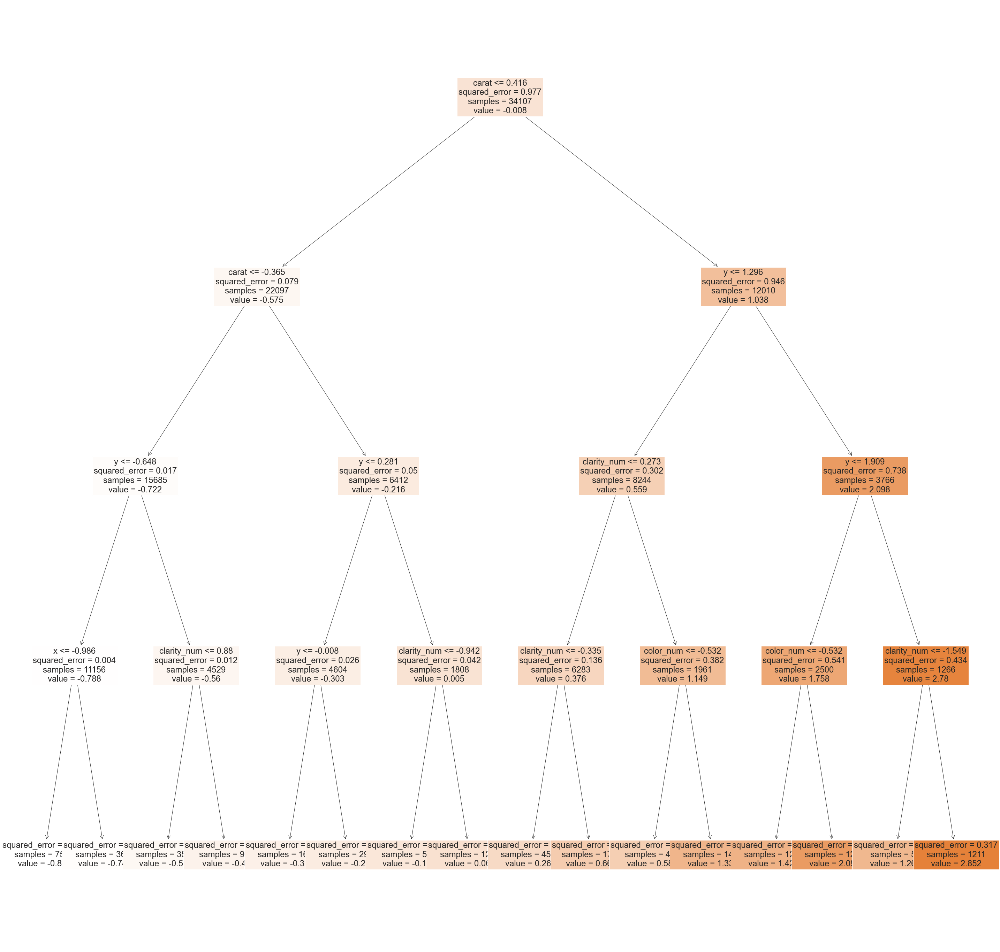

In [88]:
n_estimators = 20
for i in range(n_estimators):
    if( model.estimators_[i].tree_.max_depth == 4):
        plt.figure(figsize=(50,50))
        _ = tree.plot_tree(model.estimators_[i], feature_names=X.columns, filled=True, fontsize=24)
        break

The feature `carat` or weight of the diamond is chosen as the root node feature. Followed by dimension features `x` and `y` in the 2nd and 3rd layers. The splits sequence do match the feature importance observed using MI and F-statistic. <br>

##### For pollution dataset

In [89]:
model = RandomForestRegressor(max_features = 5, n_estimators = 20, max_depth = 4, random_state=42, n_jobs=-1)
X = pollution_df_scaled[selected_features_pollution]
y = pollution_df_scaled[target_pollution]
model.fit(X,y)

RandomForestRegressor(max_depth=4, max_features=5, n_estimators=20, n_jobs=-1,
                      random_state=42)

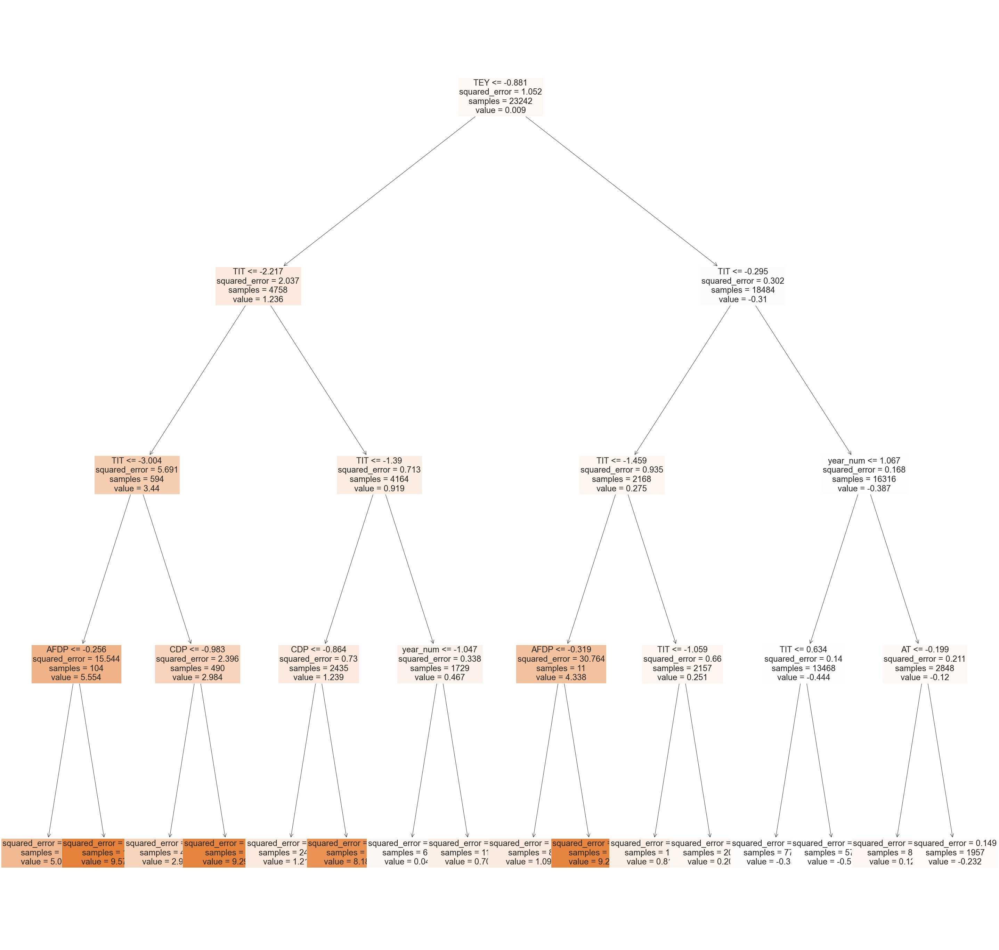

In [90]:
n_estimators = 20
for i in range(n_estimators):
    if( model.estimators_[i].tree_.max_depth == 4):
        plt.figure(figsize=(50,50))
        _ = tree.plot_tree(model.estimators_[i], feature_names=X.columns, filled=True, fontsize=24)
        break

Here also, we observe that the important features `TEY` and `TIT` are among the first features to be used for split. `TEY` is used as a feature at root node split in line with MI and F-stat scores.

## LightGBM, CatBoost

### QUESTION 22

#### Light GBM

Light GBM uses leaf wise tree growth algorithm, while many other popular tools use depth-wise tree growth. Compared with depth-wise growth, the leaf-wise algorithm can converge much faster. However, the leaf-wise growth may be over-fitting if not used with the appropriate parameters. <br>

**Parameters for LightGBM:** <br>
1. num_leaves: controls complexity of tree model.  num_leaves = 2^(max_depth), gives same leaves as depth based algorithms.leaf-wise tree is typically much deeper than a depth-wise tree for a fixed number of leaves. <br>
2. min_data_in_leaf: minimum number of samples in leaf nodes. prevents overfitting. depends on num_leaves and training sample. <br>
3. max_depth: to limit tree depth <br>

For better accuracy use small learning rate and large num_iterations

#### Catboost GBM

**Parameters for CatBoostGBM:** <br>

1. number of trees (num_trees)
2. learning rate (learning_rate) : affects the overall time of training 
3. tree depth (depth)
4. L2 regularisation (l2_leaf_reg)
5. min_data_in_leaf

##### For diamonds dataset

In [91]:
start_time = time.time()

model = LGBMRegressor(seed = 42)
grid_params = {'n_estimators': [20, 50, 100, 200],
        'num_leaves': [30, 40, 50, 60, 80],
        'max_depth': [2, 4, 6, 8, 10],
        'min_data_in_leaf': [5, 10, 20, 30]}

# best_params, cv_results = perform_gridsearch(model, diamonds_df_scaled, selected_features_diamond,\
#                                                          target_diamond, grid_params, 10)
# print("done in %0.3fs." % (time.time() - start_time))  ## 180 sec

In [92]:
start_time = time.time()

model = CatBoostRegressor(loss_function = 'RMSE', random_seed = 42, grow_policy = 'Lossguide')
grid_params = {'num_trees': [50, 100, 150, 200],
        'depth': [2, 4, 6, 8, 10],
        'l2_leaf_reg': [0.01, 0.1, 0.2, 0.5, 1, 10, 20],
        'min_data_in_leaf': [5, 10, 20, 30],
       'learning_rate': [0.001, 0.01, 0.1, 0.5]}

# best_params, cv_results = perform_gridsearch(model, diamonds_df_scaled, selected_features_diamond,\
#                                                          target_diamond, grid_params, 10)
# print("done in %0.3fs." % (time.time() - start_time)) 

### QUESTION 23

In [110]:
def perform_bayes_gridsearch(model, data: pd.DataFrame(), features: list, target: str, grid_params : dict, cv = 10):
    '''
    Given a model and a grid perform grid search on the given dataset.
    Returns best parameters and cross validation results 
    '''
    X = data[features]
    y = data[target]
    
    grid = BayesSearchCV(model, grid_params, scoring='neg_root_mean_squared_error', cv = cv,\
                                   return_train_score=True, n_jobs = -1, verbose = False)
    grid.fit(X, y)
    tmp = pd.DataFrame.from_dict(grid.cv_results_)
    tmp = tmp[['params', 'mean_train_score', 'mean_test_score', 'rank_test_score', 'mean_fit_time']]
    tmp['mean_train_score'] = tmp['mean_train_score'].apply(lambda x: -x)
    tmp['mean_test_score'] = tmp['mean_test_score'].apply(lambda x: -x)
    return grid.best_params_ , tmp

##### For diamonds dataset

In [111]:
start_time = time.time()

model = LGBMRegressor(seed = 42)
grid_params = {'n_estimators': [20, 50, 100, 200],
        'num_leaves': [30, 40, 50, 60, 80],
        'max_depth': [2, 4, 6, 8, 10],
        'min_data_in_leaf': [5, 10, 20, 30]}

best_params_lgbm, cv_results_lgbm = perform_bayes_gridsearch(model, diamonds_df_scaled, selected_features_diamond,\
                                                         target_diamond, grid_params, 10)
print("done in %0.3fs." % (time.time() - start_time))  

done in 134.506s.


In [112]:
print("Best parameters for Light GBM on diamonds dataset is..")
best_params_lgbm

Best parameters for Light GBM on diamonds dataset is..


OrderedDict([('max_depth', 4),
             ('min_data_in_leaf', 5),
             ('n_estimators', 200),
             ('num_leaves', 40)])

In [113]:
cv_results_lgbm[cv_results_lgbm['params'] == best_params_lgbm][:1]

,params,mean_train_score,mean_test_score,rank_test_score,mean_fit_time
30,"{'max_depth': 4, 'min_data_in_leaf': 5, 'n_est...",0.126345,0.157522,1,0.552465


In [114]:
model = LGBMRegressor(**best_params_lgbm, seed = 42)
result = train_model(model, diamonds_df_scaled, selected_features_diamond, target_diamond, 'LightGBM', best_params_lgbm, 10)
all_model_results_diamond.append(result)


In [115]:
start_time = time.time()

model = CatBoostRegressor(loss_function = 'RMSE', random_seed = 42, grow_policy = 'Lossguide', verbose = False)
grid_params = {'num_trees': [50, 100, 150, 200],
        'depth': [2, 4, 6, 8, 10],
        'l2_leaf_reg': [0.01, 0.1, 0.2, 0.5, 1, 10, 20],
        'min_data_in_leaf': [5, 10, 20, 30],
       'learning_rate': [0.001, 0.01, 0.1, 0.5]}

best_params_catb, cv_results_catb = perform_bayes_gridsearch(model, diamonds_df_scaled, selected_features_diamond,\
                                                         target_diamond, grid_params, 10)
print("done in %0.3fs." % (time.time() - start_time)) 

done in 351.188s.


In [116]:
print("Best parameters for Catboost on diamonds dataset is..")
best_params_catb

Best parameters for Catboost on diamonds dataset is..


OrderedDict([('depth', 4),
             ('l2_leaf_reg', 0.01),
             ('learning_rate', 0.1),
             ('min_data_in_leaf', 5),
             ('num_trees', 200)])

In [117]:
cv_results_catb[cv_results_catb['params'] == best_params_catb][:1]

,params,mean_train_score,mean_test_score,rank_test_score,mean_fit_time
42,"{'depth': 4, 'l2_leaf_reg': 0.01, 'learning_ra...",0.128398,0.155931,1,5.113333


In [118]:
model = CatBoostRegressor(**best_params_catb, loss_function = 'RMSE', random_seed = 42, grow_policy = 'Lossguide')
result = train_model(model, diamonds_df_scaled, selected_features_diamond, target_diamond, 'CatBoost', best_params_catb, 10)
all_model_results_diamond.append(result)


[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] min

[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] min

[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] min

[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] min

### QUESTION 24

##### For Light GBM

In [119]:
cv_results_lgbm['max_depth'] = cv_results_lgbm['params'].apply(lambda x: x['max_depth'])
cv_results_lgbm['num_leaves'] = cv_results_lgbm['params'].apply(lambda x: x['num_leaves'])
cv_results_lgbm['n_estimators'] = cv_results_lgbm['params'].apply(lambda x: x['n_estimators'])
cv_results_lgbm['min_data_in_leaf'] = cv_results_lgbm['params'].apply(lambda x: x['min_data_in_leaf'])
cv_results_lgbm['gap'] = cv_results_lgbm.apply(lambda row: (row['mean_test_score'] - row['mean_train_score']), axis = 1)


In [120]:
parameters = ['n_estimators', 'max_depth', 'min_data_in_leaf', 'num_leaves']
for param in parameters:
    cv_results_lgbm[param] = cv_results_lgbm['params'].apply(lambda x: x[param])
cv_results_lgbm['gap'] = cv_results_lgbm.apply(lambda row: (row['mean_test_score'] - row['mean_train_score']), axis = 1)



In [121]:
def plot_metrics(data, parameter, metric, title):
    data = data.drop(['params'], axis = 1)
    data = data.drop_duplicates()
    plt.figure(figsize=(12,4))
    plt.scatter(data[parameter], data['mean_test_score'])
    plt.xlabel(parameter)
    plt.ylabel(metric)
    plt.title(title, fontsize = 14)
    plt.grid('True')
    plt.show()

Print performance plots...


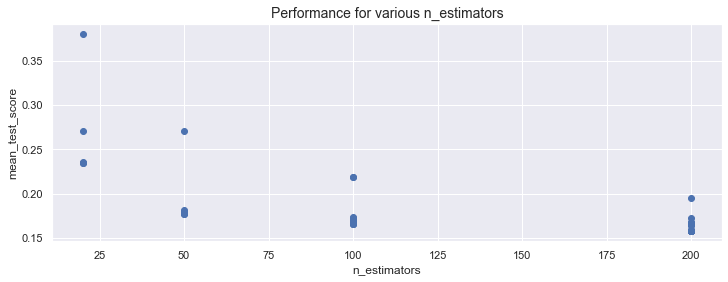

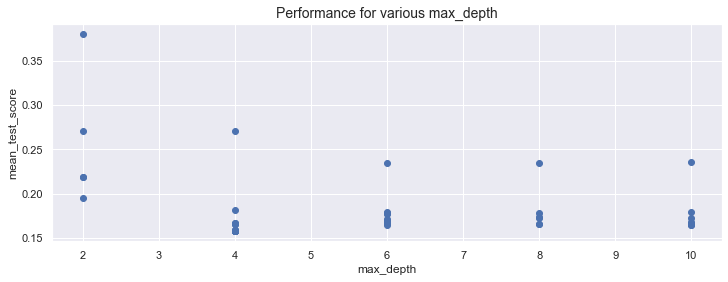

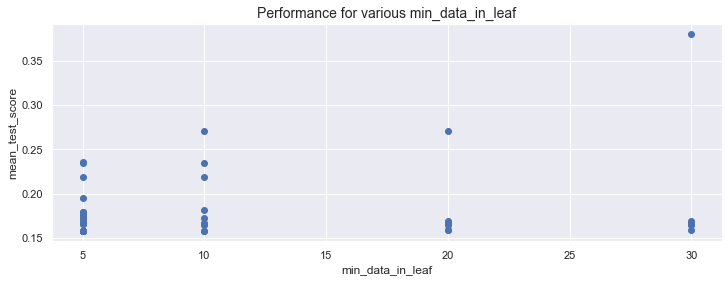

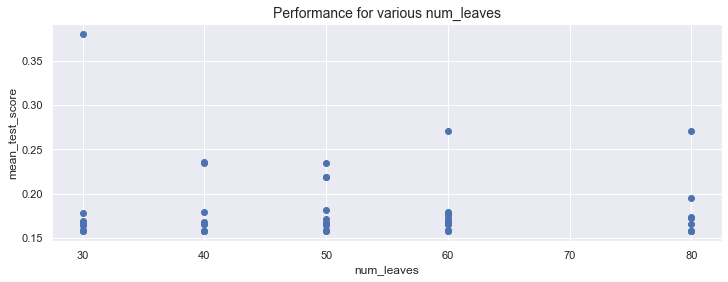

In [122]:
print("Print performance plots...")
for parameter in parameters: 
    plot_metrics(cv_results_lgbm, parameter, 'mean_test_score', "Performance for various "+parameter)
    

Print performance gap plots...


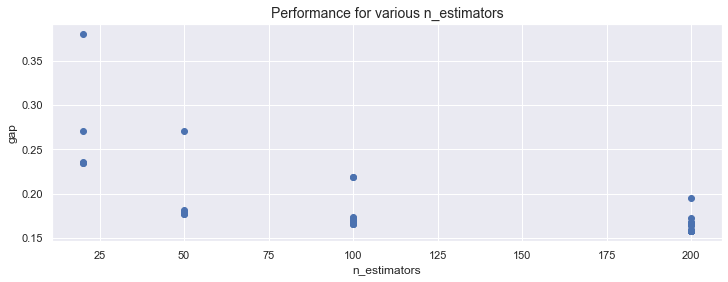

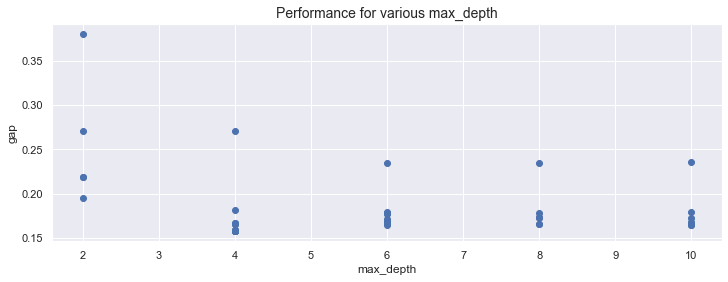

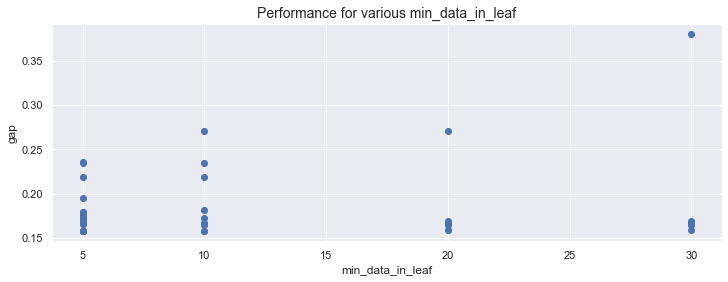

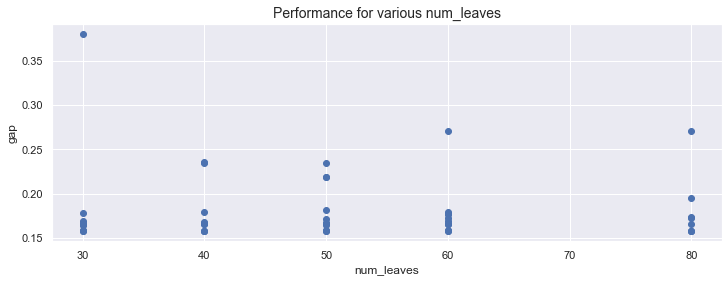

In [123]:
print("Print performance gap plots...")
for parameter in parameters: 
    plot_metrics(cv_results_lgbm, parameter, 'gap', "Performance for various "+parameter)


Print fit efficienct plots...


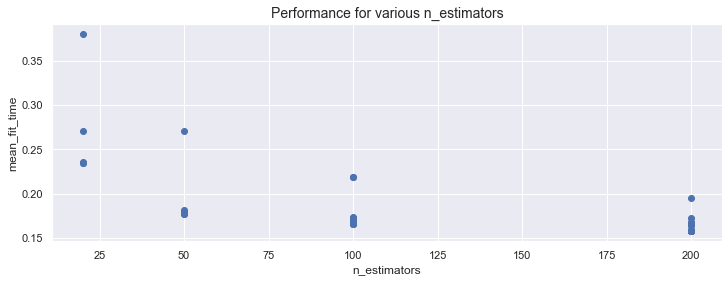

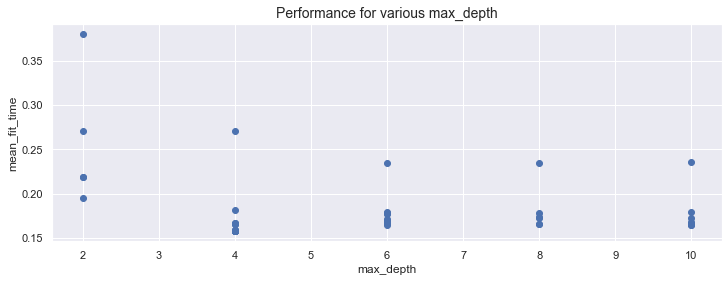

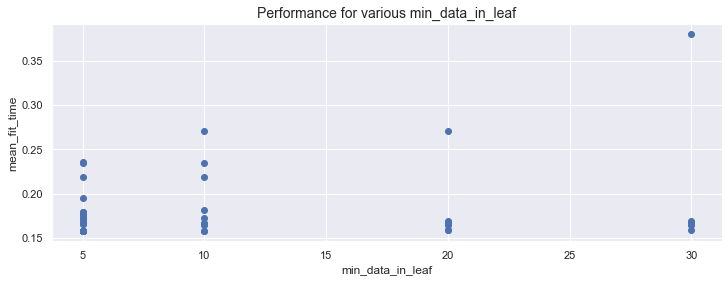

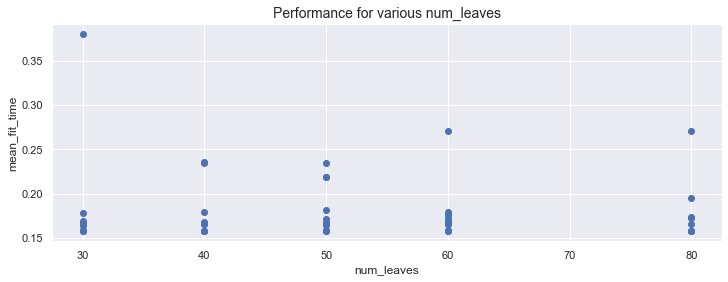

In [124]:
print("Print fit efficienct plots...")

for parameter in parameters: 
    plot_metrics(cv_results_lgbm, parameter, 'mean_fit_time', "Performance for various "+parameter)


We observe that `n_estimators` and `max_depth` helps improve the model performance in LightGBM. `max_depth`, `num_leaves` and `num_iterations` affect the fit efficiency of the model.

##### For Catboost regressor

In [125]:
cat_params = ['num_trees', 'learning_rate', 'depth', 'l2_leaf_reg', 'min_data_in_leaf']

In [126]:
for param in cat_params:
    cv_results_catb[param] = cv_results_catb['params'].apply(lambda x: x[param])

cv_results_catb['gap'] = cv_results_catb.apply(lambda row: (row['mean_test_score'] - row['mean_train_score']), axis = 1)


Print performance plots...


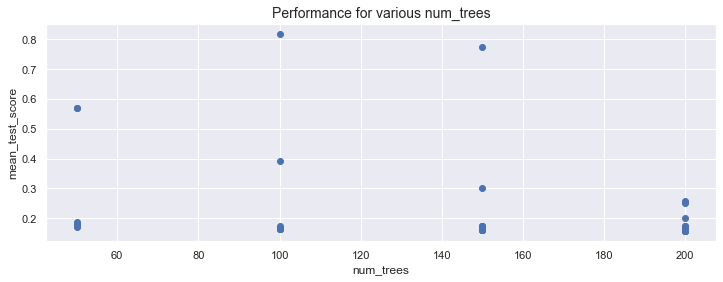

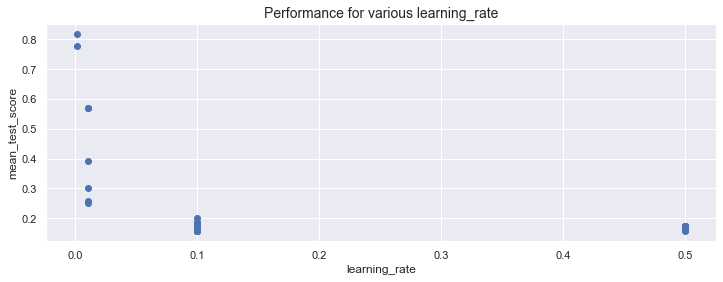

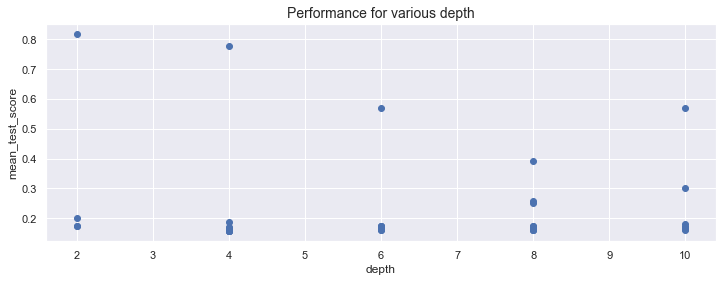

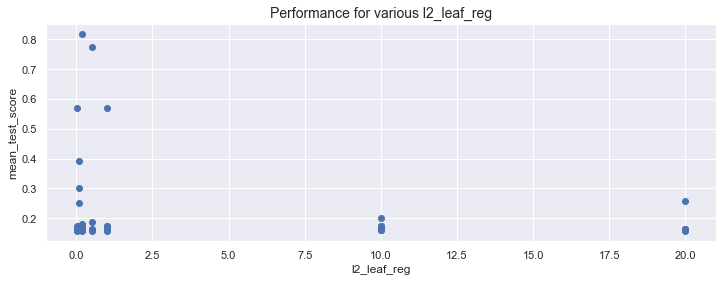

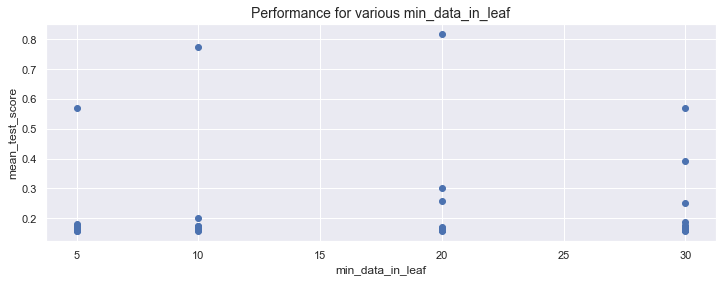

In [127]:
print("Print performance plots...")
for parameter in cat_params: 
    plot_metrics(cv_results_catb, parameter, 'mean_test_score', "Performance for various "+parameter)

Print performance gap plots...


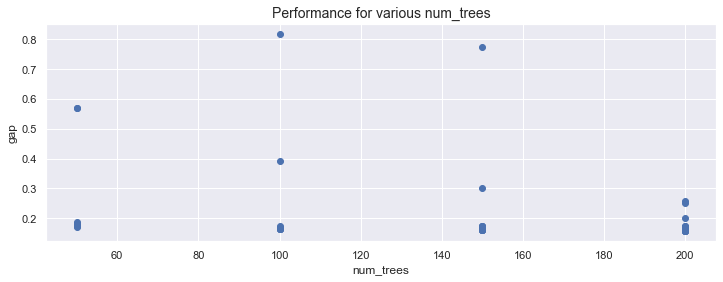

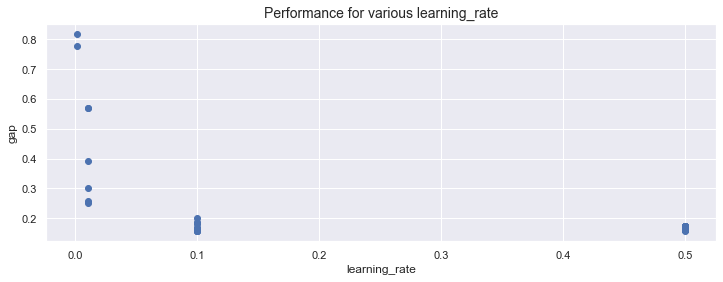

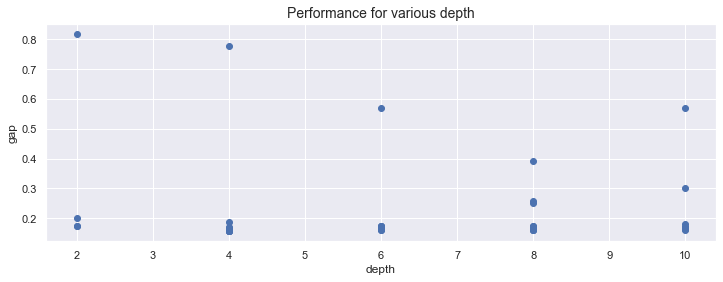

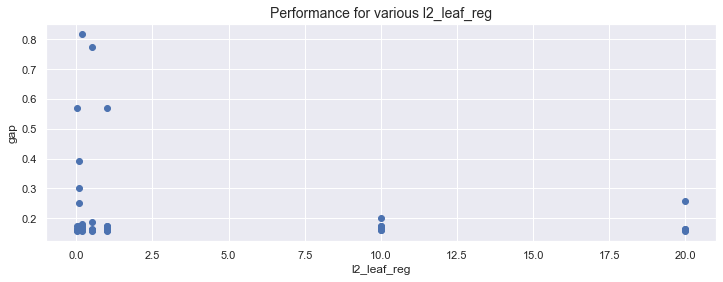

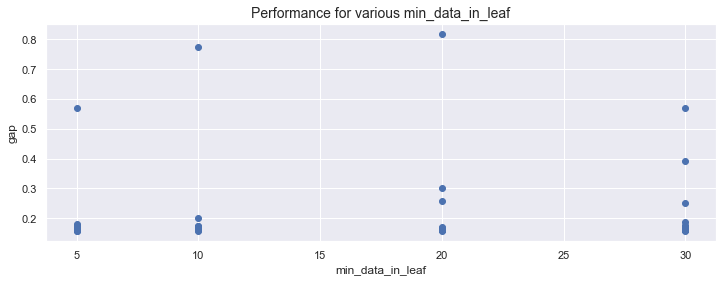

In [128]:
print("Print performance gap plots...")
for parameter in cat_params: 
    plot_metrics(cv_results_catb, parameter, 'gap', "Performance for various "+parameter)

Print fit efficienct plots...


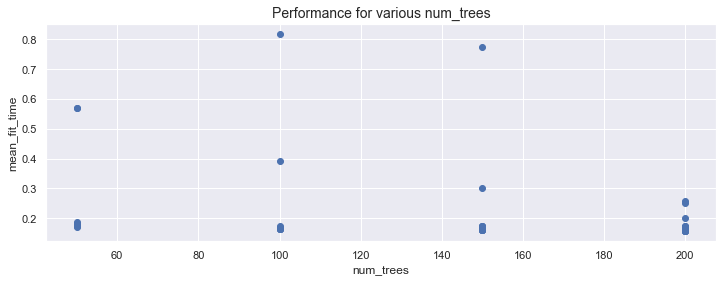

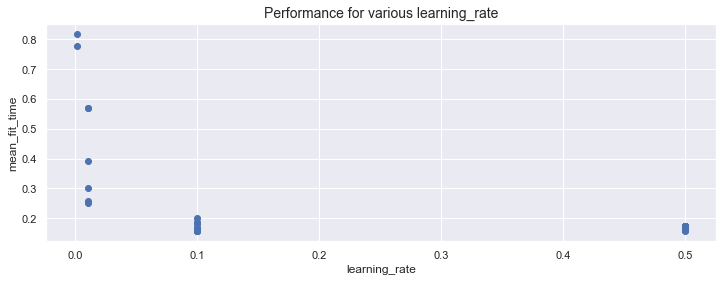

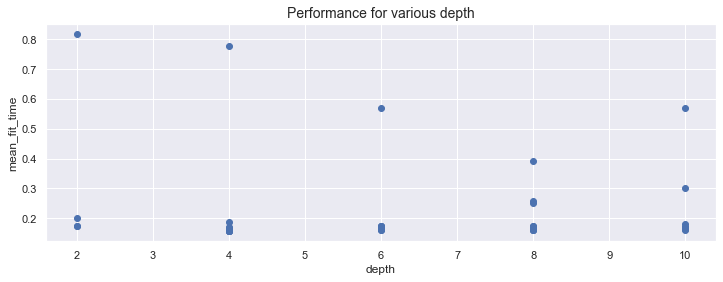

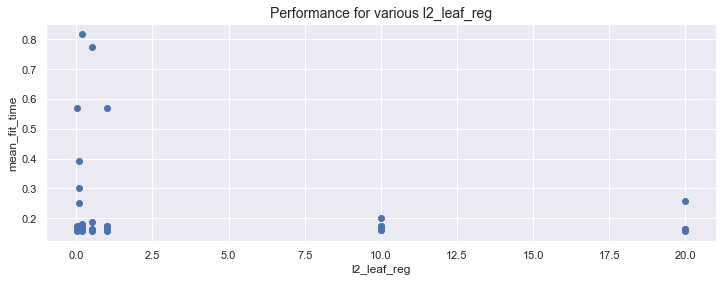

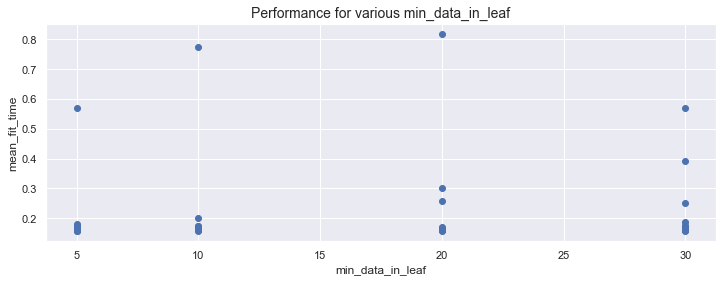

In [129]:
print("Print fit efficienct plots...")

for parameter in cat_params: 
    plot_metrics(cv_results_catb, parameter, 'mean_fit_time', "Performance for various "+parameter)

`n_estimators` or `num_trees` and `learning_rate` affects the fit efficiency. `l2_leaf_reg` helps with the regularisation. `num_trees` and `depth` affect the performance of the model

### QUESTION 25

##### For diamonds dataset

In [130]:
pd.DataFrame.from_dict(all_model_results_diamond)

,model,params,avg_train_rmse,avg_test_rmse
0,Linear Regression,NA,0.306212,0.307871
1,Lasso Regression,{'alpha': 0.0001},0.306215,0.307962
2,Ridge Regression,{'alpha': 0.0001},0.306212,0.307871
3,Lasso (poly degree=2),{'alpha': 0.01},0.210834,0.209531
4,MLPRegressor,"{'activation': 'relu', 'alpha': 0.001, 'hidden...",0.152632,0.156963
5,RandomForest,"{'max_depth': 6, 'max_features': 4, 'n_estimat...",0.185170,0.249404
6,LightGBM,"{'max_depth': 4, 'min_data_in_leaf': 10, 'n_es...",0.127457,0.158015
7,CatBoost,"{'max_depth': 4, 'min_data_in_leaf': 10, 'n_es...",0.120934,0.154430
8,LightGBM,"{'max_depth': 4, 'min_data_in_leaf': 5, 'n_est...",0.126345,0.157522
9,CatBoost,"{'depth': 4, 'l2_leaf_reg': 0.01, 'learning_ra...",0.128398,0.155931


##### For pollution dataset

In [131]:
pd.DataFrame.from_dict(all_model_results_pollution)

,model,params,avg_train_rmse,avg_test_rmse
0,Linear Regression,NA,0.662448,0.690991
1,Lasso Regression,{'alpha': 0.001},0.663014,0.689782
2,Ridge Regression,{'alpha': 100},0.665031,0.689959
3,Lasso (poly degree=4),{'alpha': 0.001},0.499656,0.602067
4,MLPRegressor,"{'activation': 'relu', 'alpha': 1, 'hidden_lay...",0.630128,0.655230
5,RandomForest,"{'max_depth': 6, 'max_features': 5, 'n_estimat...",0.473607,0.600993


Training RMSE indicates the error on the dataset using which the model was trained to get the parameters. Since, this is the dataset the model parameters are learnt on, the model performs well on this dataset compared to the validation set, which is the dataset on which the model is scored. The loss minimization happens using the training sample. Hence, the train and validation RMSE values are different.

### QUESTION 26

##### For diamonds dataset

In [137]:
a = pd.DataFrame.from_dict(all_model_results_diamond)
params = list(a[a['model'] == 'RandomForest']['params'])[0]

In [138]:
start_time = time.time()

model = RandomForestRegressor(**params, n_jobs = -1, oob_score=True, random_state = 42)
X = diamonds_df_scaled[selected_features_diamond]
y = diamonds_df_scaled[target_diamond]
model.fit(X,y)
print("OOB error is: ", (1-model.oob_score_))


print("done in %0.3fs." % (time.time() - start_time))  

OOB error is:  0.03732291704030033
done in 0.993s.


##### For pollution dataset

In [135]:
a = pd.DataFrame.from_dict(all_model_results_pollution)
params = list(a[a['model'] == 'RandomForest']['params'])[0]

In [136]:
start_time = time.time()

model = RandomForestRegressor(**params, n_jobs = -1, oob_score=True, random_state = 42)
X = pollution_df_scaled[selected_features_pollution]
y = pollution_df_scaled[target_pollution]
model.fit(X,y)
print("OOB error is: ", (1-model.oob_score_))


print("done in %0.3fs." % (time.time() - start_time)) 

OOB error is:  0.28851981528348747
done in 0.174s.


In random forest, each tree is trained on a subset sample obtained by bootstrapping the training data. So each tree is not built using the entire training sample. Out of bag error for a sample is the error obtained using prediction from the trees which did not use this sample to train the splits/model. An aggregate of this error for each sample is the out of bag error for the random forest model. It can be used to estimate validation or test error. <br>

R_squared is the coefficient of correlation which is the proportion of the variation in the dependent variable that is predictable from the independent variable(s). It is given by 1- (residual sum of squares/ total sum of squares). Similar to OOB RMSE (error) value, R_squared can be calculated using the out of bag samples only.

## EXTRAS

https://towardsdatascience.com/top-3-methods-for-handling-skewed-data-1334e0debf45 <br>
https://quantifyinghealth.com/f-statistic-in-linear-regression/ <br>
https://towardsdatascience.com/select-features-for-machine-learning-model-with-mutual-information-534fe387d5c8 <br>

**Data Scaling:** 

Normalizing all the variables to be in the same range (between 0 to 1) improves ML performance, especially for models which use a weighted sum of input such as linear models and neural networks as well as models that use distance measures such as support vector machines and k-nearest neighbor. <br>

Good practice to scale data and perhaps even make the data more normal (fit a Gaussian probability distribution) using a power transform. By default, the PowerTransformer also performs a standardization of each variable after performing the transform. <br>

For regression problems it is often desirable to scale or transform both input and target variables. <br>

Feature scaling improves the convergence of steepest descent algorithms, which do not possess the property of scale invariance. A step through one weight update of size 𝛾 will yield much better reduction in the error in the properly scaled case than the improperly scaled case. Normalizing the output will not affect shape of 𝑓, so it's generally not necessary. <br>

A target variable with a large spread of values, in turn, may result in large error gradient values causing weight values to change dramatically, making the learning process unstable. This is best modeled with a linear activation function. If the distribution of the value is normal, then you can standardize the output variable. Otherwise, the output variable can be normalized. <br>

there's also a demonstration on code where the model weights exploded during training given the very large errors and, in turn, error gradients calculated for weight updates also exploded. In short, if you don't scale the data and you have very large values, make sure to use very small learning rate values. - more relevant to neural networks <br>

One reason for normalising the inputs is to make gradient descent more stable, as gradients spend more time in a comfortable region with meaningful updates and less neurons 'die' during trainings - getting stuck at one of the tails of e.g. the sigmoid non-linearity. <br>

Normalising the output distribution is perhaps not the best idea, as you are by definition altering the defition of the target. This means you are essentially predicting a distribution that doesn't mirror your real-world target (at least without some reverse non-linear transforms later on). <br>

On this you could do would be to scale the target, instead of normalising. The shape of the distribution should remain almost identical (thinking about the shape of the distribution), but the values themselves might be more easily attainable and therefore faster to optimise for; they are all closer in magnitude to the gradients that are being computed. <br>


 

Links used to study: <br>
https://machinelearningmastery.com/how-to-transform-target-variables-for-regression-with-scikit-learn/ <br>
https://stats.stackexchange.com/questions/111467/is-it-necessary-to-scale-the-target-value-in-addition-to-scaling-features-for-re <br>
https://stackoverflow.com/questions/57583657/benefits-of-transforming-scaling-target-variable-in-supervised-learning <br>
https://machinelearningmastery.com/how-to-improve-neural-network-stability-and-modeling-performance-with-data-scaling/ <br>

**Unbiased vs biased standard scalar**

**Review OLS assumptions on data for linear regression**

**Pearson correlation cutoff:** We generally consider correlations above 0.4 to be relatively strong; correlations between 0.2 and 0.4 are moderate, and those below 0.2 are considered weak. <br>

https://askinglot.com/what-is-a-good-pearson-correlation

Mutual Information works similar to information gain in decision tree classifiers. It measures the entropy drop under the condition of target variable. Keep features with MI > 0.2

Lasso - Least absolute shrinkage and selection operator

https://stats.stackexchange.com/questions/174897/choosing-the-range-and-grid-density-for-regularization-parameter-in-lasso

https://ai.stackexchange.com/questions/20680/should-neural-nets-be-deeper-the-more-complex-the-learning-problem-is
https://datascience.stackexchange.com/questions/23287/why-large-weights-are-prohibited-in-neural-networks 

In [ ]:
def lasso_regression(data: pd.DataFrame(), features: list, target: str, grid_params : dict, cv = 10):
    
    X = data[features]
    y = data[target]
    
    reg = Lasso(random_state = 42)
    grid = GridSearchCV(reg, grid_params, scoring='neg_root_mean_squared_error', cv = cv,\
                                   return_train_score=True, n_jobs = -1)
    grid.fit(X, y)
    return grid.best_params_ , grid.cv_results_, grid.best_score_